#**Introduction**

In [ ]:
#@title Set up the environment
import numpy as np
import sys
import pandas as pd
from collections import Counter, defaultdict
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense,Flatten,Input,Lambda,GlobalAveragePooling2D,Dropout,Conv2D,BatchNormalization,MaxPooling2D,Input,Activation
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array,array_to_img
from tensorflow.keras.optimizers import Adam,RMSprop,SGD
from tensorflow.keras.applications.densenet import DenseNet169, preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau
import sklearn
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import os
import math
from tensorflow.keras.regularizers import l2
import json
import random

In [ ]:
SEED = 4224
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)


In [ ]:
#@title Mount the *My Drive* folder
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#@title Set the path
train_path=('/content/drive/My Drive/AI project/Train')

# Define the path to your dataset
dataset_path = "/content/drive/My Drive/Applied AI/AI Project 2024-2025/Train"

# List all files in the directory
all_files = os.listdir(dataset_path)

# Filter files that contain "fullslice" in their name
fullslice_files = [file for file in all_files if "fullslice" in file] # I take only the "fullslice" data

# Print the filtered list
print("Files with 'fullslice' in their name:")
print(fullslice_files)



Files with 'fullslice' in their name:
['pat401_fullslice.nrrd', 'pat444_fullslice.nrrd', 'pat40_fullslice.nrrd', 'pat438_fullslice.nrrd', 'pat433_fullslice.nrrd', 'pat3_fullslice.nrrd', 'pat423_fullslice.nrrd', 'pat398_fullslice.nrrd', 'pat446_fullslice.nrrd', 'pat424_fullslice.nrrd', 'pat395_fullslice.nrrd', 'pat440_fullslice.nrrd', 'pat399_fullslice.nrrd', 'pat431_fullslice.nrrd', 'pat418_fullslice.nrrd', 'pat394_fullslice.nrrd', 'pat406_fullslice.nrrd', 'pat442_fullslice.nrrd', 'pat39_fullslice.nrrd', 'pat425_fullslice.nrrd', 'pat421_fullslice.nrrd', 'pat414_fullslice.nrrd', 'pat396_fullslice.nrrd', 'pat436_fullslice.nrrd', 'pat412_fullslice.nrrd', 'pat426_fullslice.nrrd', 'pat392_fullslice.nrrd', 'pat500_fullslice.nrrd', 'pat487_fullslice.nrrd', 'pat47_fullslice.nrrd', 'pat456_fullslice.nrrd', 'pat492_fullslice.nrrd', 'pat474_fullslice.nrrd', 'pat486_fullslice.nrrd', 'pat46_fullslice.nrrd', 'pat4_fullslice.nrrd', 'pat481_fullslice.nrrd', 'pat484_fullslice.nrrd', 'pat482_fullslice.n

Count unique labels:

In [ ]:
# Extract unique patient identifiers
patient_ids = {file.split("_")[0] for file in fullslice_files}

# Count the number of unique patients
num_patients = len(patient_ids)

# Print the results
print("Files with 'fullslice' in their name:")
print(fullslice_files)
print(f"Number of unique patients selected: {num_patients}")

Files with 'fullslice' in their name:
['pat401_fullslice.nrrd', 'pat444_fullslice.nrrd', 'pat40_fullslice.nrrd', 'pat438_fullslice.nrrd', 'pat433_fullslice.nrrd', 'pat3_fullslice.nrrd', 'pat423_fullslice.nrrd', 'pat398_fullslice.nrrd', 'pat446_fullslice.nrrd', 'pat424_fullslice.nrrd', 'pat395_fullslice.nrrd', 'pat440_fullslice.nrrd', 'pat399_fullslice.nrrd', 'pat431_fullslice.nrrd', 'pat418_fullslice.nrrd', 'pat394_fullslice.nrrd', 'pat406_fullslice.nrrd', 'pat442_fullslice.nrrd', 'pat39_fullslice.nrrd', 'pat425_fullslice.nrrd', 'pat421_fullslice.nrrd', 'pat414_fullslice.nrrd', 'pat396_fullslice.nrrd', 'pat436_fullslice.nrrd', 'pat412_fullslice.nrrd', 'pat426_fullslice.nrrd', 'pat392_fullslice.nrrd', 'pat500_fullslice.nrrd', 'pat487_fullslice.nrrd', 'pat47_fullslice.nrrd', 'pat456_fullslice.nrrd', 'pat492_fullslice.nrrd', 'pat474_fullslice.nrrd', 'pat486_fullslice.nrrd', 'pat46_fullslice.nrrd', 'pat4_fullslice.nrrd', 'pat481_fullslice.nrrd', 'pat484_fullslice.nrrd', 'pat482_fullslice.n

Let's create the Dataframe:

In [ ]:
import pandas as pd

# Path to the Excel file
excel_file = "/content/drive/My Drive/Applied AI/AI Project 2024-2025/dataset_lung.xlsx"

# Read the Excel file into a DataFrame
df = pd.read_excel(excel_file)

# Filter rows based on fullslice_files
# Assuming the filenames are in the first column of the Excel file
filtered_df = df[df.iloc[:, 0].isin(fullslice_files)]

# Extract the third element (assuming the third column is index 2)
data = filtered_df.iloc[:, 0]  # Filenames
labels = filtered_df.iloc[:, 2]  # Corresponding third column

# Create a new DataFrame with filenames and their labels
result_df = pd.DataFrame({
    "Filename": data.values,
    "Label": labels.values
})

# Add a third column with the categorization
def categorize_label(label):
    if label in [4, 5]:
        return "malignant"
    elif label in [1, 2, 3]:
        return "benign"
    else:
        return "unknown"  # Optional: handle unexpected label values

result_df["Category"] = result_df["Label"].apply(categorize_label)

# Print or save the resulting DataFrame
print(result_df)

# Optionally, save to a new Excel or CSV file
result_df.to_excel("filtered_data_with_categories.xlsx", index=False)

                    Filename  Label   Category
0        pat1_fullslice.nrrd      5  malignant
1        pat2_fullslice.nrrd      5  malignant
2        pat3_fullslice.nrrd      2     benign
3        pat4_fullslice.nrrd      5  malignant
4        pat5_fullslice.nrrd      4  malignant
...                      ...    ...        ...
2358  pat2368_fullslice.nrrd      2     benign
2359  pat2369_fullslice.nrrd      2     benign
2360  pat2387_fullslice.nrrd      5  malignant
2361  pat2399_fullslice.nrrd      5  malignant
2362  pat2415_fullslice.nrrd      5  malignant

[2363 rows x 3 columns]


Let's visualize 10 random images with their label and category:

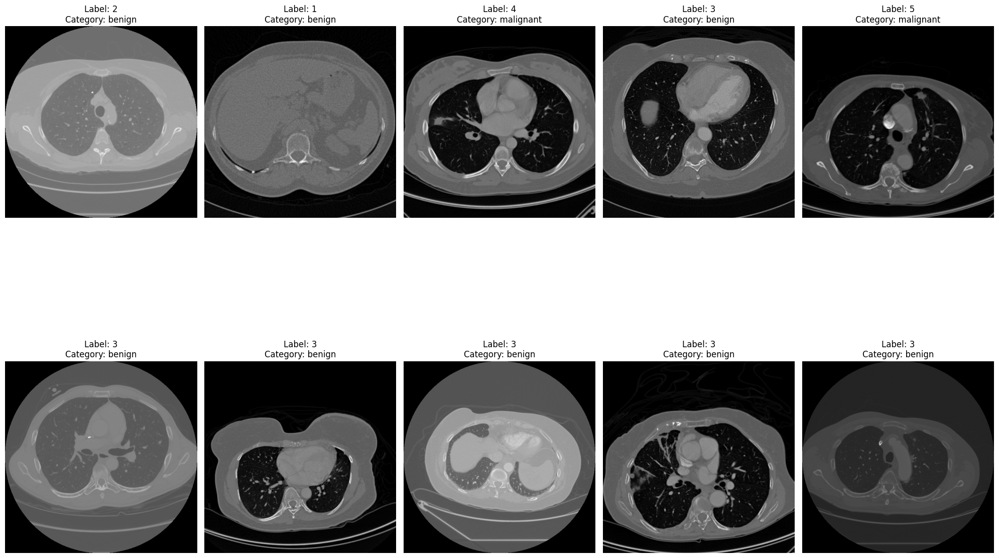

In [ ]:
!pip install pynrrd
import matplotlib.pyplot as plt
import nrrd
import random

# Path to the directory where the .nrrd files are stored
data_directory = "/content/drive/My Drive/Applied AI/AI Project 2024-2025/Train"

# Randomly select 20 rows from result_df
sampled_df = result_df.sample(n=10, random_state=42)

# Create a plot with 20 subplots (4 rows x 5 columns)
fig, axes = plt.subplots(2, 5, figsize=(20, 16))
axes = axes.ravel()  # Flatten the 2D array of axes

# Iterate over the sampled filenames, labels, and categories
for i, (filename, label, category) in enumerate(zip(sampled_df["Filename"], sampled_df["Label"], sampled_df["Category"])):
    # Load the .nrrd file
    image_path = f"{data_directory}/{filename}"
    image, _ = nrrd.read(image_path)  # Read the image and ignore the header

    # Plot the image in grayscale
    axes[i].imshow(image, cmap="gray")
    # Set the title with Label and Category
    axes[i].set_title(f"Label: {label}\nCategory: {category}")
    axes[i].axis("off")  # Turn off axes

# Hide any unused axes (in case there are fewer than 20 images)
for j in range(len(sampled_df), len(axes)):
    axes[j].axis("off")

# Adjust layout
plt.tight_layout()
plt.show()

This shape is probably due to class Imbalance – some classes might have different brightness characteristics.

Caricamento immagini nel DataFrame:

In [ ]:
!pip install pynrrd
import nrrd
import os
from multiprocessing import Pool

# Path alla directory delle immagini
image_dir = "/content/drive/MyDrive/Applied AI/AI Project 2024-2025/Train/"

def load_image(filename):
    filepath = os.path.join(image_dir, filename)
    img_data, _ = nrrd.read(filepath)
    return img_data

# Use multiprocessing to load images in parallel
with Pool() as pool:
    images = pool.map(load_image, result_df["Filename"].tolist())

# Add the loaded images to the DataFrame
result_df["Image"] = images
print("Tutte le immagini sono state caricate.")

Tutte le immagini sono state caricate.


Check the structure:

In [ ]:
# Display the first few rows of the DataFrame
print(result_df.head())

# Show DataFrame structure (columns, data types, non-null values)
print(result_df.info())

# Display summary statistics (if numeric data is present)
print(result_df.describe())

              Filename  Label   Category  \
0  pat1_fullslice.nrrd      5  malignant   
1  pat2_fullslice.nrrd      5  malignant   
2  pat3_fullslice.nrrd      2     benign   
3  pat4_fullslice.nrrd      5  malignant   
4  pat5_fullslice.nrrd      4  malignant   

                                               Image  
0  [[-2048, -2048, -2048, -2048, -2048, -2048, -2...  
1  [[-3024, -3024, -3024, -3024, -3024, -3024, -3...  
2  [[-2048, -2048, -2048, -2048, -2048, -2048, -2...  
3  [[-2048, -2048, -2048, -2048, -2048, -2048, -2...  
4  [[-2048, -2048, -2048, -2048, -2048, -2048, -2...  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2363 entries, 0 to 2362
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Filename  2363 non-null   object
 1   Label     2363 non-null   int64 
 2   Category  2363 non-null   object
 3   Image     2363 non-null   object
dtypes: int64(1), object(3)
memory usage: 74.0+ KB
None
             La

Visualize a few images:

Image 1 Type: <class 'numpy.ndarray'>


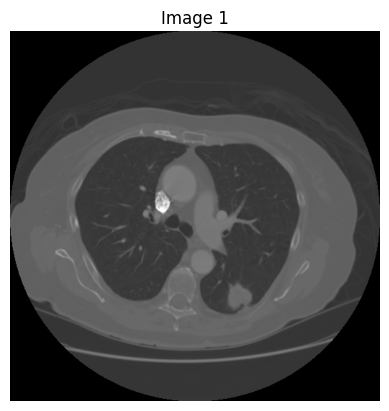

Image 2 Type: <class 'numpy.ndarray'>


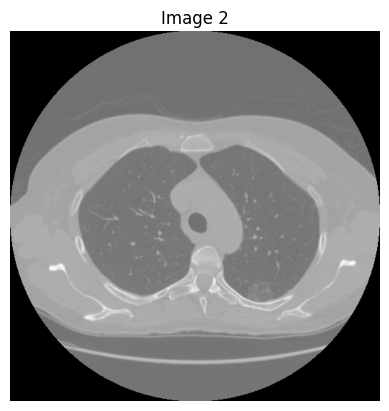

Image 3 Type: <class 'numpy.ndarray'>


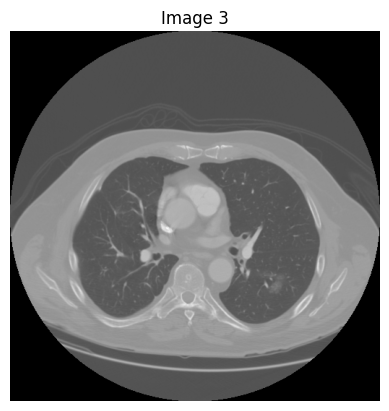

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to display an image slice from a 3D NRRD array
def show_nrrd_image(nrrd_data, title="Image Slice", slice_idx=None):
    if nrrd_data is None:
        print("Empty image data, skipping visualization.")
        return

    # If the image is 3D, select a middle slice
    if len(nrrd_data.shape) == 3:
        if slice_idx is None:
            slice_idx = nrrd_data.shape[2] // 2  # Take middle slice
        image_slice = nrrd_data[:, :, slice_idx]
    else:
        image_slice = nrrd_data  # If already 2D, use it as is

    plt.imshow(image_slice, cmap="gray")  # Display in grayscale
    plt.title(title)
    plt.axis("off")
    plt.show()

# Show a few images from the DataFrame
num_images = 3  # Change this to show more images
for i in range(min(num_images, len(result_df))):
    image = result_df.loc[i, "Image"]
    image_type = type(image)  # Get the type of the image
    print(f"Image {i+1} Type: {image_type}")  # Print image type
    show_nrrd_image(image, title=f"Image {i+1}")


# Mean pixel values

Mean pixel values:

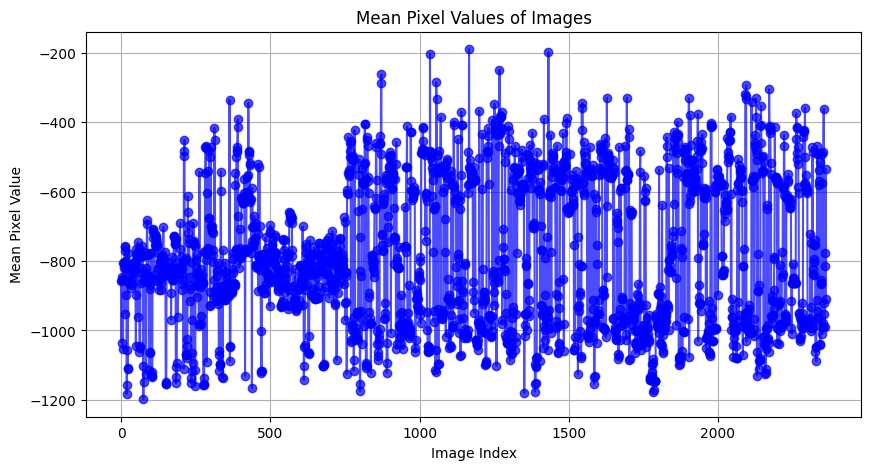

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Compute the mean pixel values for each image
result_df["Mean_Pixel_Value"] = result_df["Image"].apply(lambda img: np.mean(img) if isinstance(img, np.ndarray) else np.nan)

# Plot mean pixel values
plt.figure(figsize=(10, 5))
plt.plot(result_df.index, result_df["Mean_Pixel_Value"], marker='o', linestyle='-', color='b', alpha=0.7)
plt.xlabel("Image Index")
plt.ylabel("Mean Pixel Value")
plt.title("Mean Pixel Values of Images")
plt.grid(True)
plt.show()


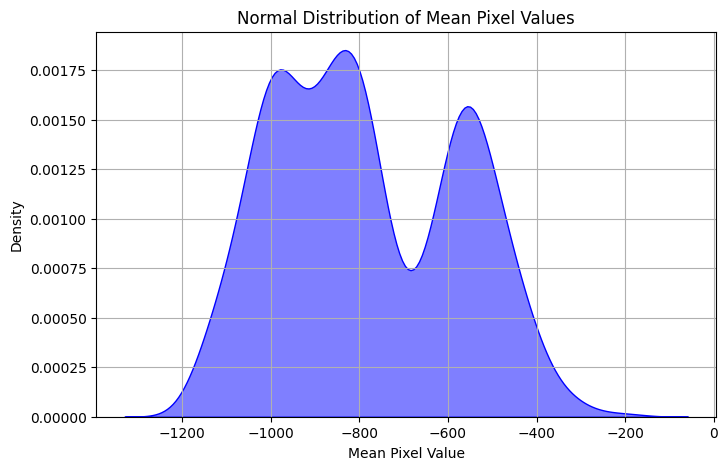

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the mean pixel values for each image
result_df["Mean_Pixel_Value"] = result_df["Image"].apply(lambda img: np.mean(img) if isinstance(img, np.ndarray) else np.nan)

# Drop NaN values (if any)
mean_pixel_values = result_df["Mean_Pixel_Value"].dropna()

# Plot KDE (Kernel Density Estimation) for a smooth normal-like curve
plt.figure(figsize=(8, 5))
sns.kdeplot(mean_pixel_values, fill=True, color="blue", alpha=0.5)

# Labels and title
plt.xlabel("Mean Pixel Value")
plt.ylabel("Density")
plt.title("Normal Distribution of Mean Pixel Values")
plt.grid(True)

# Show the plot
plt.show()


This shape is probably due to class Imbalance – some classes might have different brightness characteristics.

Distribuzione classi prima di rimozione outliers:

<ipython-input-13-7606361e6827>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=result_df["Label"], palette="viridis")


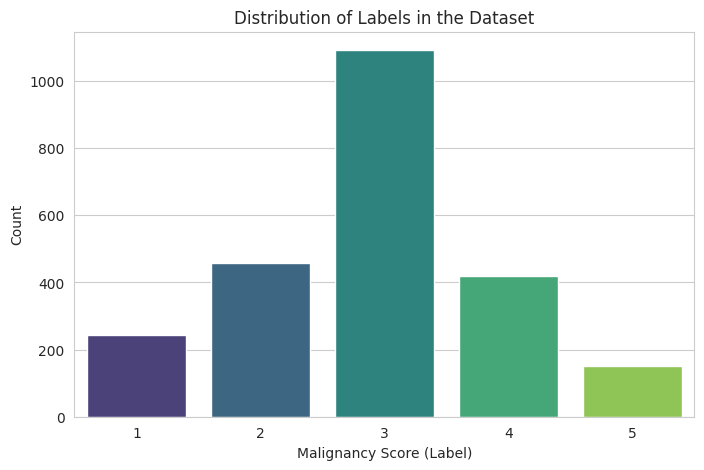

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set_style("whitegrid")

# Plot label distribution
plt.figure(figsize=(8, 5))
sns.countplot(x=result_df["Label"], palette="viridis")

# Labels and title
plt.xlabel("Malignancy Score (Label)")
plt.ylabel("Count")
plt.title("Distribution of Labels in the Dataset")

# Show plot
plt.show()


# Preprocessing e outliers

Preprocessing e outliers (la skippo perché insensato):

Numero di outlier rilevati: 119


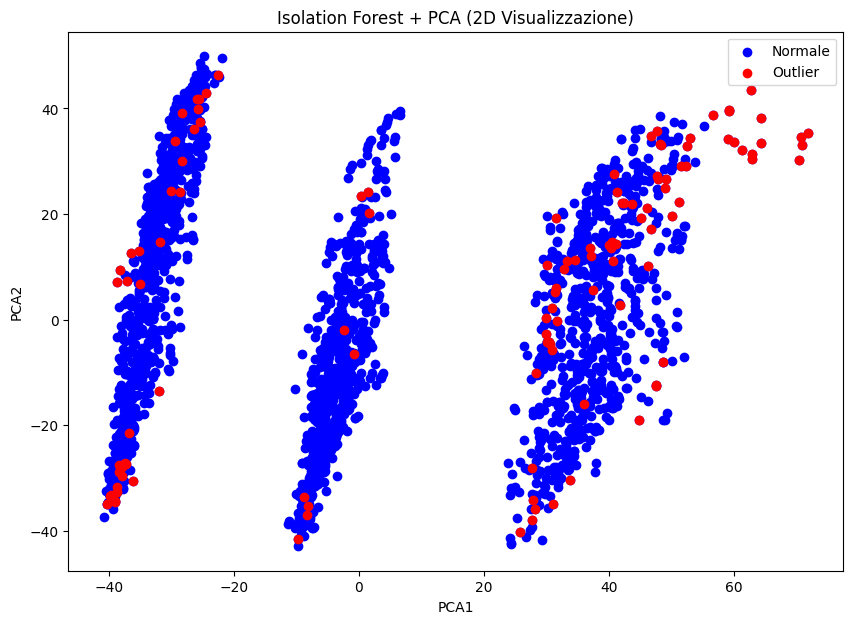

Filenames degli outlier rilevati:
['pat20_fullslice.nrrd', 'pat21_fullslice.nrrd', 'pat46_fullslice.nrrd', 'pat50_fullslice.nrrd', 'pat62_fullslice.nrrd', 'pat74_fullslice.nrrd', 'pat173_fullslice.nrrd', 'pat238_fullslice.nrrd', 'pat265_fullslice.nrrd', 'pat278_fullslice.nrrd', 'pat279_fullslice.nrrd', 'pat301_fullslice.nrrd', 'pat383_fullslice.nrrd', 'pat384_fullslice.nrrd', 'pat392_fullslice.nrrd', 'pat404_fullslice.nrrd', 'pat426_fullslice.nrrd', 'pat427_fullslice.nrrd', 'pat464_fullslice.nrrd', 'pat487_fullslice.nrrd', 'pat759_fullslice.nrrd', 'pat760_fullslice.nrrd', 'pat793_fullslice.nrrd', 'pat798_fullslice.nrrd', 'pat802_fullslice.nrrd', 'pat817_fullslice.nrrd', 'pat860_fullslice.nrrd', 'pat868_fullslice.nrrd', 'pat869_fullslice.nrrd', 'pat870_fullslice.nrrd', 'pat872_fullslice.nrrd', 'pat873_fullslice.nrrd', 'pat887_fullslice.nrrd', 'pat888_fullslice.nrrd', 'pat906_fullslice.nrrd', 'pat907_fullslice.nrrd', 'pat908_fullslice.nrrd', 'pat909_fullslice.nrrd', 'pat919_fullslice.nrr

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import cv2  # OpenCV for resizing images

# Ensure result_df is defined
if "result_df" not in globals():
    raise ValueError("Errore: result_df non è definito. Assicurati di caricare i dati prima.")

# Step 1: Reduce Image Size Before Flattening
def preprocess_image(img, target_size=(64, 64)):  # Adjust size to reduce memory usage
    if img is None:
        return None
    if len(img.shape) == 3:  # If 3D, take middle slice
        img = img[:, :, img.shape[2] // 2]
    img_resized = cv2.resize(img, target_size)  # Resize the picture to 64x64 to reduce features
    return img_resized.flatten().astype(np.float32)  # Flatten image to a 1D array

# Apply preprocessing and filter out None values from the result_df["Image"] column
valid_images = result_df["Image"].dropna().tolist()
flattened_images = np.array([preprocess_image(img) for img in valid_images if img is not None])

if len(flattened_images) == 0:
    raise ValueError("Errore: Nessuna immagine valida trovata in result_df['Image'].")

# Step 2: Standardization
scaler = StandardScaler()
flattened_images_std = scaler.fit_transform(flattened_images) # standardization of pixel values to help PCA work better

# Step 3: PCA Dimensionality Reduction
pca = PCA(n_components=10)
reduced_data = pca.fit_transform(flattened_images_std)
# Reduces the number of features from 64×64 = 4,096 per image to just 10 principal components
# This makes Isolation Forest run faster and use less memory

# Step 4: Apply Isolation Forest for Outlier Detection
iso_forest = IsolationForest(contamination=0.05, random_state=42) # it assumes 5% of the images are outliers
predictions = iso_forest.fit_predict(reduced_data)

# Step 5: Store Results
result_df.loc[result_df["Image"].notna(), "Outlier"] = predictions == -1 # Updates result_df by marking outliers (True for anomalies, False otherwise)
n_outliers = result_df["Outlier"].sum()
print(f"Numero di outlier rilevati: {n_outliers}")

# Step 6: Visualization (PCA to 2D)
pca_2d = PCA(n_components=2)
reduced_data_2d = pca_2d.fit_transform(flattened_images_std)

outlier_mask = result_df.loc[result_df["Image"].notna(), "Outlier"].astype(bool).values

plt.figure(figsize=(10, 7))
plt.scatter(reduced_data_2d[:, 0], reduced_data_2d[:, 1], c="blue", label="Normale")
if np.any(outlier_mask):
    plt.scatter(reduced_data_2d[outlier_mask, 0], reduced_data_2d[outlier_mask, 1], c="red", label="Outlier")

plt.title("Isolation Forest + PCA (2D Visualizzazione)")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.legend()
plt.show()

# Step 7: Print Outlier Filenames
outlier_filenames = result_df.loc[result_df["Outlier"] == True, "Filename"]
print("Filenames degli outlier rilevati:")
print(outlier_filenames.tolist())

Plot the outliers and the corrresponding label:

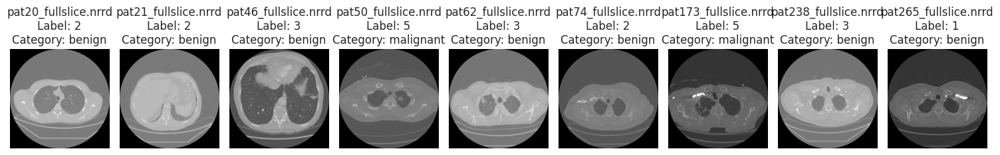

In [ ]:
import matplotlib.pyplot as plt

# Filter outlier images and their information
outlier_data = result_df.loc[result_df["Outlier"] == True, ["Image", "Filename", "Label", "Category"]]

# Convert to lists for easy access
outlier_images = outlier_data["Image"].tolist()
outlier_filenames = outlier_data["Filename"].tolist()
outlier_labels = outlier_data["Label"].tolist()
outlier_categories = outlier_data["Category"].tolist()

# Define the number of images to display
num_images = min(9, len(outlier_images))  # Show up to 9 images

# Create a figure for visualization
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

for i in range(num_images):
    img = outlier_images[i]

    if len(img.shape) == 3:  # If 3D, take the middle slice
        img = img[:, :, img.shape[2] // 2]

    axes[i].imshow(img, cmap="gray")  # Display in grayscale
    axes[i].set_title(f"{outlier_filenames[i]}\nLabel: {outlier_labels[i]}\nCategory: {outlier_categories[i]}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Image enhancement

Histogram Equalization, Contrast-Limited Adaptive Histogram Equalization (CLAHE), Median Filter, morphological operators:

In [ ]:
import cv2
import numpy as np
from skimage import exposure

def preprocess_image(img, target_size=(224, 224)):
    """Applies preprocessing steps from the paper to a lung CT scan image."""

    if img is None:
        return None

    # Convert 3D CT scan to 2D (middle slice extraction)
    if len(img.shape) == 3:
        img = img[:, :, img.shape[2] // 2]

    # Normalize pixel values (range goes to 0-1)
    img = img.astype(np.float32)
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)  # Avoid division by zero

    # Step 1: Apply Histogram Equalization (for contrast enhancement)
    img_eq = exposure.equalize_hist(img)

    # Step 2: Apply Contrast-Limited Adaptive Histogram Equalization (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_clahe = clahe.apply((img_eq * 255).astype(np.uint8))

    # Step 3: Apply Median Filtering for Noise Reduction
    img_filtered = cv2.medianBlur(img_clahe, 3)  # Apply median filter with kernel size of 3

    # Step 4: Apply Morphological Operations (Dilation & Erosion)
    kernel = np.ones((3, 3), np.uint8)
    img_morph = cv2.dilate(img_filtered, kernel, iterations=1)  # Apply dilation
    img_morph = cv2.erode(img_morph, kernel, iterations=1)  # Apply erosion

    # Step 5: Resize to (224x224) for CNN input
    img_resized = cv2.resize(img_morph, target_size)

    # Step 6: Normalize pixel values again (0-1)
    img_final = img_resized.astype(np.float32) / 255.0

    return img_final


Let's visualize the change in a single random image:

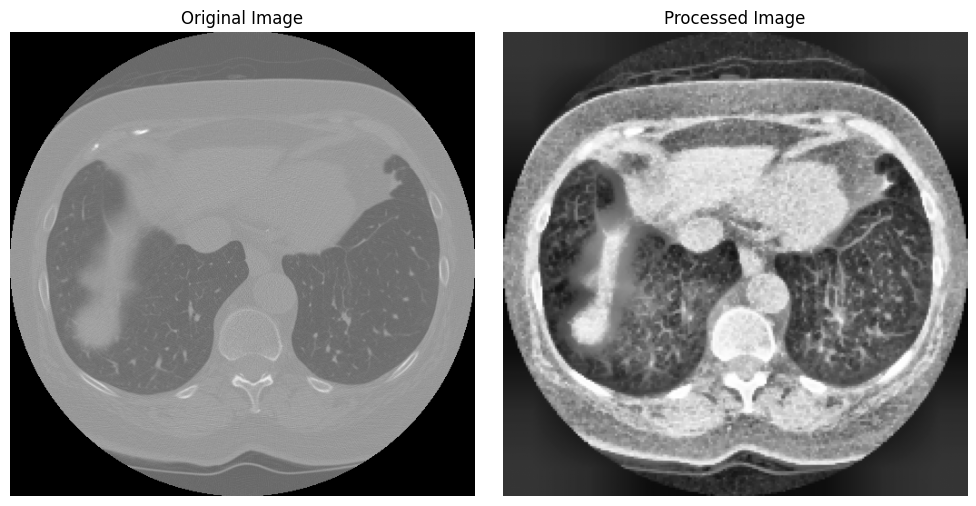

In [ ]:
import matplotlib.pyplot as plt
import nrrd  # Assuming images are in .nrrd format

# Path to an example image (Modify this based on your dataset)
image_path = "/content/drive/My Drive/Applied AI/AI Project 2024-2025/Train/pat2415_fullslice.nrrd"

# Load the image (assuming it's 2D grayscale)
image, _ = nrrd.read(image_path)  # Read image, ignore header

# Apply preprocessing
processed_image = preprocess_image(image)

# Plot Original vs. Processed Image
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(processed_image, cmap="gray")
axes[1].set_title("Processed Image")
axes[1].axis("off")

plt.tight_layout()
plt.show()


Apply it to all images:

In [ ]:
# Apply preprocessing to all images in result_df
result_df["Image"] = result_df["Image"].apply(lambda img: preprocess_image(img) if img is not None else None)

# Convert list of images to NumPy array
X = np.stack(result_df["Image"].dropna().values)
X = np.expand_dims(X, axis=-1)  # Add channel dimension (grayscale)

print("Preprocessing complete! Image shape:", X.shape)


Preprocessing complete! Image shape: (2363, 224, 224, 1)


# Split

Split of the data into training, validation and test set:

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import cv2  # OpenCV for resizing images
import gc
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical

# result_df["Image"] contains the ndarray images (already loaded as NumPy arrays)

# Step 1: Filter out outliers (where "Outlier" is True)
#cleaned_df = result_df[result_df["Outlier"] == False]  # Only keep rows where Outlier is False

# Step 2: Extract images and labels from cleaned_df
X = np.array([img for img in result_df["Image"]])  # The images are stored as ndarray
y = result_df["Label"].values  # The labels (malignancy score, ranging from 1 to 5)

# Step 3: Label encoding
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Encode labels to integers (0-4)

# Step 4: Resize and normalize the images
# X_resized = np.array([cv2.resize(img, (224, 224)) for img in X])  # Resize images to 224x224 --> already done in the preprocess_image function

# Normalize images (important for CNN performance)
# X_resized = X_resized / 255.0  # Scale to [0, 1] range --> already done in the preprocess_image function

# Step 4: Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Convert labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=5)
y_val = to_categorical(y_val, num_classes=5)
y_test = to_categorical(y_test, num_classes=5)

# Print the shape of the training, validation, and test sets to verify
print(f"Training data shape: {X_train.shape}, Training labels shape: {y_train.shape}")
print(f"Validation data shape: {X_val.shape}, Validation labels shape: {y_val.shape}")
print(f"Test data shape: {X_test.shape}, Test labels shape: {y_test.shape}")

# Free memory by deleting unused variables
del X, y, X_temp, y_temp  # Delete original dataset and temp variables

# Force garbage collection
gc.collect()

# Clear TensorFlow session
K.clear_session()

Training data shape: (1890, 224, 224), Training labels shape: (1890, 5)
Validation data shape: (236, 224, 224), Validation labels shape: (236, 5)
Test data shape: (237, 224, 224), Test labels shape: (237, 5)


Let's check the distribution of the pixel values, which should be between 0 and 1:

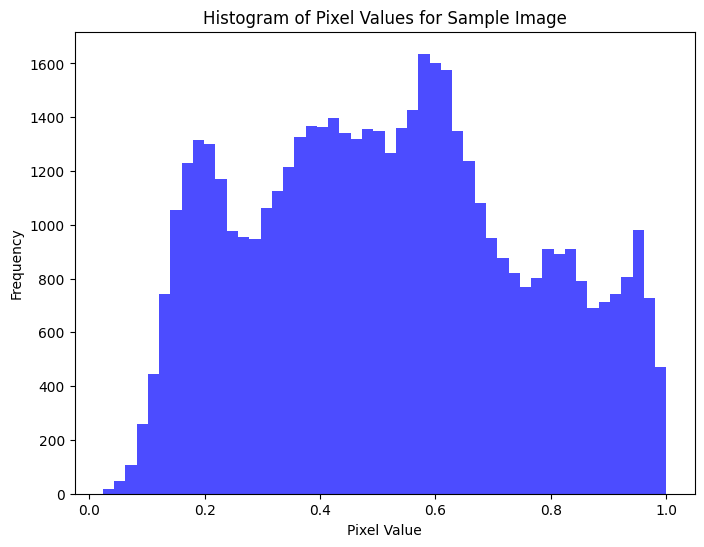

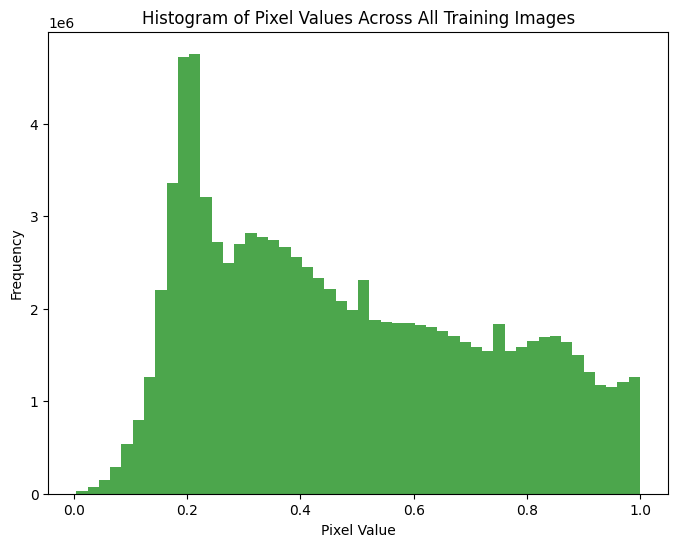

In [ ]:
import matplotlib.pyplot as plt

# Visualizing histogram for a sample image
sample_image = X_train[0]  # Take one image from the training set (you can choose any)

# Flatten the image to 1D for histogram plotting
sample_image_flattened = sample_image.flatten()

# Plot the histogram of pixel values
plt.figure(figsize=(8, 6))
plt.hist(sample_image_flattened, bins=50, color='blue', alpha=0.7)
plt.title("Histogram of Pixel Values for Sample Image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

# Visualizing histogram for all images in the dataset
# Flatten all images to create a single array of pixel values
all_images_flattened = X_train.flatten()

# Plot the histogram for all pixel values in the dataset
plt.figure(figsize=(8, 6))
plt.hist(all_images_flattened, bins=50, color='green', alpha=0.7)
plt.title("Histogram of Pixel Values Across All Training Images")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()


Distribuzione classi dopo rimozione outliers:

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set_style("whitegrid")

# Plot label distribution
plt.figure(figsize=(8, 5))
sns.countplot(x=cleaned_df["Label"], palette="viridis")

# Labels and title
plt.xlabel("Malignancy Score (Label)")
plt.ylabel("Count")
plt.title("Distribution of Labels in the Dataset")

# Show plot
plt.show()


# Upsampling (al posto di celle split)

Salto preprocessing e faccio questo prima dello split:

In [ ]:
import numpy as np

# Convert the list of images into a NumPy array
X = np.array(result_df["Image"].tolist(), dtype=np.float32)  # Ensure consistent dtype

# Print shape to verify
print("Shape of X:", X.shape)


Shape of X: (2363, 224, 224)


In [ ]:
min_val = np.min(X)
max_val = np.max(X)
X= (X - min_val) / (max_val - min_val).astype('float32')

In [ ]:
from PIL import Image

def resize_image(image_array, target_size):
    image = Image.fromarray(image_array)
    resized_image = image.resize(target_size)
    return np.array(resized_image)

# Assuming X is your NumPy array of images
X_resized = [resize_image(img, (224, 224)) for img in X]
X = np.array(X_resized)



In [ ]:
def sigmoidal_contrast(image, cutoff, gain=10):
    """
    Apply sigmoidal contrast enhancement to an image.

    Parameters:
        image (numpy.ndarray): Grayscale input image.
        cutoff (float): The gray value around which contrast is adjusted (e.g., the mean value).
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        numpy.ndarray: Image with enhanced contrast.
    """

    # Apply sigmoid function
    sigmoidal_image = 1 / (1 + np.exp(-gain * (image - cutoff )))

    # Rescale to range [0, 255] and convert to uint8
    enhanced_image = (sigmoidal_image).astype(np.float32)

    return enhanced_image


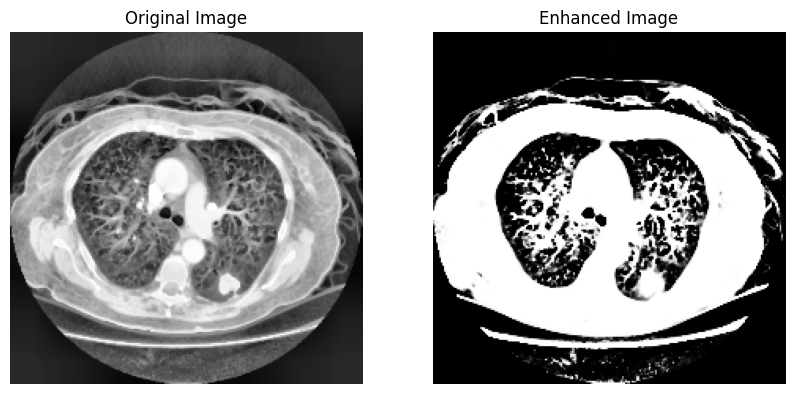

In [ ]:
# Calculate the mean gray value (cutoff)
image=X[0]
mean_value = np.mean(image)

# Apply sigmoidal contrast enhancement
enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=50)

# Display original and enhanced images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap="gray") # Remove the extra index [:,:,0]
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Enhanced Image")
plt.imshow(enhanced_image, cmap="gray") # Remove the extra index [:,:,0] and rescale if necessary
plt.axis("off")

plt.show()

In [ ]:

def process_images(images, gain=10):
    """
    Apply sigmoidal contrast enhancement to a list of images.

    Parameters:
        images (list of numpy.ndarray): List of grayscale images.
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        list of numpy.ndarray: List of enhanced images.
    """
    enhanced_images = []
    for image in images:
        if image is None:
            print("Warning: Found a None image. Skipping.")
            continue

        # Calculate the mean gray value (cutoff)
        mean_value = np.mean(image)

        # Apply sigmoidal contrast enhancement
        enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=gain)
        enhanced_images.append(enhanced_image)

    return enhanced_images


In [ ]:

def process_images_in_batches(images, batch_size, gain=10):
    """
    Apply sigmoidal contrast enhancement to images in batches.

    Parameters:
        images (list of numpy.ndarray): List of grayscale images.
        batch_size (int): Number of images to process in each batch.
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        list of numpy.ndarray: List of enhanced images.
    """
    enhanced_images = []
    for i in tqdm(range(0, len(images), batch_size)):
        batch = images[i:i + batch_size]
        for image in batch:
            if image is None:
                print("Warning: Found a None image. Skipping.")
                continue

            # Calculate the mean gray value (cutoff)
            mean_value = np.mean(image)

            # Apply sigmoidal contrast enhancement
            enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=gain)
            enhanced_images.append(enhanced_image)

    return enhanced_images


In [ ]:
from tqdm import tqdm

In [ ]:
# Process images in batches

X = process_images_in_batches(X, batch_size=32, gain=10)
X=np.array(X)

100%|██████████| 74/74 [00:00<00:00, 108.20it/s]


Split:

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import cv2  # OpenCV for resizing images
import gc
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical

# result_df["Image"] contains the ndarray images (already loaded as NumPy arrays)

# Step 1: Filter out outliers (where "Outlier" is True)
#cleaned_df = result_df[result_df["Outlier"] == False]  # Only keep rows where Outlier is False

# Step 2: Extract images and labels from cleaned_df
# X = np.array([img for img in result_df["Image"]])  # The images are stored as ndarray
y = result_df["Label"].values  # The labels (malignancy score, ranging from 1 to 5)

# Step 3: Label encoding
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Encode labels to integers (0-4)

# Step 4: Resize and normalize the images
# X_resized = np.array([cv2.resize(img, (224, 224)) for img in X])  # Resize images to 224x224 --> already done in the preprocess_image function

# Normalize images (important for CNN performance)
# X_resized = X_resized / 255.0  # Scale to [0, 1] range --> already done in the preprocess_image function

# Step 4: Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Convert labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=5)
y_val = to_categorical(y_val, num_classes=5)
y_test = to_categorical(y_test, num_classes=5)

# Print the shape of the training, validation, and test sets to verify
print(f"Training data shape: {X_train.shape}, Training labels shape: {y_train.shape}")
print(f"Validation data shape: {X_val.shape}, Validation labels shape: {y_val.shape}")
print(f"Test data shape: {X_test.shape}, Test labels shape: {y_test.shape}")

# Free memory by deleting unused variables
del X, y, X_temp, y_temp  # Delete original dataset and temp variables

# Force garbage collection
gc.collect()

# Clear TensorFlow session
K.clear_session()

Training data shape: (1890, 224, 224), Training labels shape: (1890, 5)
Validation data shape: (236, 224, 224), Validation labels shape: (236, 5)
Test data shape: (237, 224, 224), Test labels shape: (237, 5)


In [ ]:
# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)# Ensure grayscale images have a channel dimension


X_train shape: (1890, 224, 224, 1)
X_val shape: (236, 224, 224, 1)
X_test shape: (237, 224, 224, 1)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
import numpy as np
import random

# Calculate the target count based on the most numerous class in `y_train`
unique, counts = np.unique(y_train.argmax(axis=1), return_counts=True)
class_counts = dict(zip(unique, counts))
target_count = max(class_counts.values()) + 100

# Initialize the data generator with augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    #rescale=1./255,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Prepare lists to store the augmented images and labels
augmented_images = []
augmented_labels = []

# Augment underrepresented classes in `X_train` until each reaches the target count
for class_label, count in class_counts.items():
    if count < target_count:
        # Filter `X_train` to get only images of the current class
        indices = np.where(y_train.argmax(axis=1) == class_label)[0]
        X_train_class = X_train[indices]

        # Calculate the number of augmentations needed
        num_augmentations = target_count - count

        i = 0
        while i < num_augmentations:
            # Randomly select an image from `X_train_class`
            img = random.choice(X_train_class)
            x = img.reshape((1,) + img.shape)  # Reshape to add batch dimension

            # Generate one augmented image
            for batch in datagen.flow(x, batch_size=1):
                augmented_images.append(batch[0])  # Add augmented image
                augmented_labels.append(class_label)  # Add class label
                i += 1
                break  # Generate only one augmented image per selected image

# Convert augmented data to NumPy arrays
augmented_images = np.array(augmented_images)
# Convert `augmented_labels` to one-hot encoding to match `y_train` shape
augmented_labels = to_categorical(augmented_labels, num_classes=y_train.shape[1])

# Append the augmented images and labels back to `X_train` and `y_train`
X_train_balanced = np.concatenate((X_train, augmented_images), axis=0)
y_train_balanced = np.concatenate((y_train, augmented_labels), axis=0)

# Verify the new class counts in `y_train_balanced`
unique_balanced, counts_balanced = np.unique(y_train_balanced.argmax(axis=1), return_counts=True)
class_counts_balanced = dict(zip(unique_balanced, counts_balanced))

# Print the final shape and counts of each class in `X_train_balanced`
print("Class counts after balancing:")
for class_label, count in class_counts_balanced.items():
    print(f"Class {class_label}: {count}")
print("\nFinal shapes:")
print(f"X_train_balanced shape: {X_train_balanced.shape}")
print(f"y_train_balanced shape: {y_train_balanced.shape}")

X_train=np.array(X_train_balanced)
y_train=np.array(y_train_balanced)

Class counts after balancing:
Class 0: 973
Class 1: 973
Class 2: 973
Class 3: 973
Class 4: 973

Final shapes:
X_train_balanced shape: (4865, 224, 224, 1)
y_train_balanced shape: (4865, 5)


# Data augmentation

Da fare al posto di upsampling, e dopo lo split:

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1890, 224, 224, 1)

# Define ImageDataGenerator for Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    # vertical_flip=True, NO, non ha senso per i polmoni
)

# Lists to store augmented images and labels
augmented_images = []
augmented_labels = []

# Generate augmented images WITHOUT modifying the original dataset
for img, label in zip(X_train, y_train):
    augmented_image = train_datagen.random_transform(img)  # Generate an augmented version of the image
    augmented_images.append(augmented_image)  # Store the new image
    augmented_labels.append(label)  # Store the corresponding label

# Convert the augmented data into numpy arrays
X_train_augmented = np.array(augmented_images)
y_train_augmented = np.array(augmented_labels)

print("Augmented training data shape:", X_train_augmented.shape)

# Combine original and augmented data into one dataset
X_train_combined = np.concatenate([X_train, X_train_augmented], axis=0)
y_train_combined = np.concatenate([y_train, y_train_augmented], axis=0)

print(f"Final training set shape: {X_train_combined.shape}, {y_train_combined.shape}")


Augmented training data shape: (1890, 224, 224, 1)
Final training set shape: (3780, 224, 224, 1), (3780, 5)


Vediamo la differenza (le immagini sono colorate non so perché ma di fatto non sono modificate così):

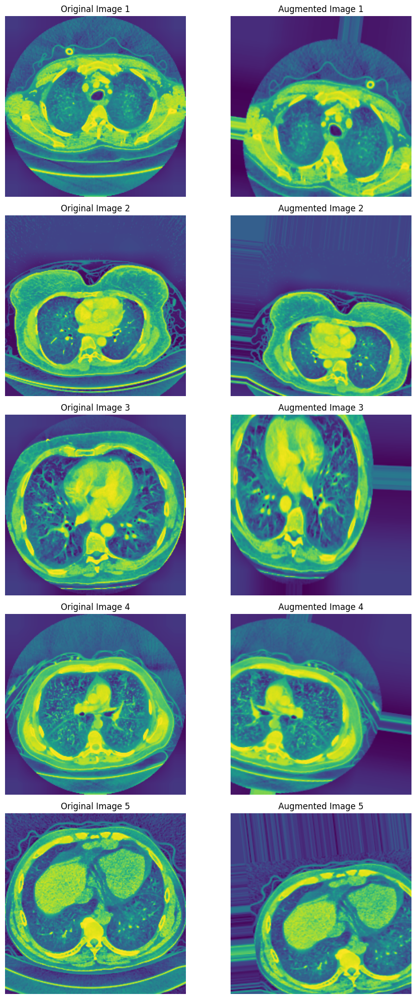

In [ ]:
import matplotlib.pyplot as plt

# Select a few random indices from the original training data
indices = np.random.choice(len(X_train), 5, replace=False)

# Create a figure to hold the original and augmented images
fig, axes = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the indices and plot original vs augmented images
for i, idx in enumerate(indices):
    # Original image
    original_image = X_train[idx]
    augmented_image = train_datagen.random_transform(original_image)  # Apply augmentation

    # Plot the original image in the left column
    axes[i, 0].imshow(original_image)
    axes[i, 0].set_title(f"Original Image {i+1}")
    axes[i, 0].axis('off')  # Hide axes for clarity

    # Plot the augmented image in the right column
    axes[i, 1].imshow(augmented_image)
    axes[i, 1].set_title(f"Augmented Image {i+1}")
    axes[i, 1].axis('off')  # Hide axes for clarity

plt.tight_layout()
plt.show()


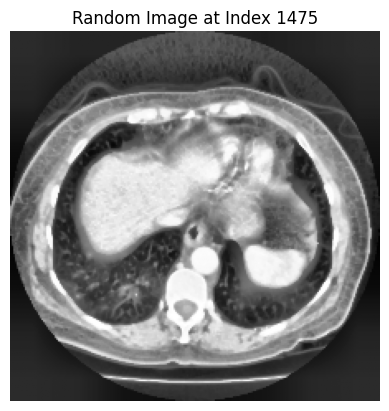

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Select a random index
random_index = np.random.randint(0, len(X_train))

# Get the image
random_image = X_train[random_index]

# If the image is grayscale (single channel), remove the last dimension for correct visualization
if random_image.shape[-1] == 1:
    random_image = random_image.squeeze()  # Remove the single channel

# Display the image
plt.imshow(random_image, cmap='gray')  # Use cmap='gray' for grayscale images
plt.title(f"Random Image at Index {random_index}")
plt.axis('off')  # Hide axes
plt.show()


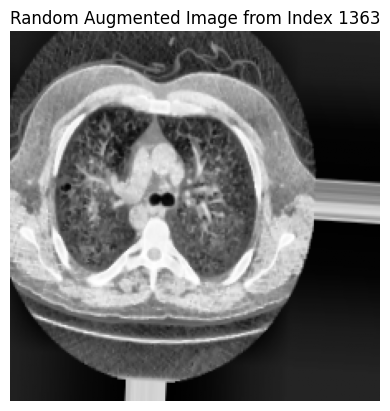

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Select a random index from X_train
random_index = np.random.randint(0, len(X_train))
random_image = X_train[random_index]

# Apply augmentation using train_datagen
augmented_image = train_datagen.random_transform(random_image)

# If the image is grayscale, remove the last dimension for correct visualization
if augmented_image.shape[-1] == 1:
    augmented_image = augmented_image.squeeze()  # Remove the single channel

# Display the augmented image
plt.imshow(augmented_image, cmap='gray')  # Use cmap='gray' for grayscale images
plt.title(f"Random Augmented Image from Index {random_index}")
plt.axis('off')  # Hide axes
plt.show()


# CNN model (mio)

First model:

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(224, 224, 1)),  # Assuming grayscale images (1 channel)

    # Convolutional layers with max pooling
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # Flatten layer to convert 2D data into 1D
    tf.keras.layers.Flatten(),

    # Dense fully connected layers
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),

    # Output layer with 5 classes (for malignancy score 1-5)
    tf.keras.layers.Dense(5, activation='softmax')  # Softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Step 7: Train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32)

# Step 8: Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test loss: {test_loss}, Test accuracy: {test_accuracy}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Epoch 1/20


ValueError: Argument `output` must have rank (ndim) `target.ndim - 1`. Received: target.shape=(None, 5), output.shape=(None, 5)

In [ ]:
from tensorflow.keras.utils import to_categorical

# Assuming y_train, y_val, and y_test are the raw labels, which should be integers (0-4)

# Check the raw labels (just for debugging)
print(f"y_train (before encoding) shape: {y_train.shape}")
print(f"y_val (before encoding) shape: {y_val.shape}")
print(f"y_test (before encoding) shape: {y_test.shape}")

# Ensure the raw labels are in integer format (if they are not)
# For example, if they are one-hot encoded already or in some other format, you need to fix that
# You should replace this step if your labels are already in integer format.
# Example of how the labels might look like:
y_train = y_train.argmax(axis=-1)  # Convert one-hot encoded to integers (if necessary)
y_val = y_val.argmax(axis=-1)
y_test = y_test.argmax(axis=-1)

# Now apply one-hot encoding
y_train = to_categorical(y_train, num_classes=5)
y_val = to_categorical(y_val, num_classes=5)
y_test = to_categorical(y_test, num_classes=5)

# Print the new shapes
print(f"y_train shape: {y_train.shape}")
print(f"y_val shape: {y_val.shape}")
print(f"y_test shape: {y_test.shape}")

# Now you can proceed with training your model

y_train (before encoding) shape: (1890, 5)
y_val (before encoding) shape: (236, 5)
y_test (before encoding) shape: (237, 5)
y_train shape: (1890, 5)
y_val shape: (236, 5)
y_test shape: (237, 5)


Let's make a more complex model

In [ ]:
from tensorflow.keras.utils import to_categorical



model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(224, 224, 1)),  # Input layer (grayscale images)
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')  # Output layer with 5 classes
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Step 7: Train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=25, batch_size=32)

# Step 8: Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test loss: {test_loss}, Test accuracy: {test_accuracy}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 36s 356ms/step - accuracy: 0.4077 - loss: 1.6334 - val_accuracy: 0.4619 - val_loss: 1.4281
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - accuracy: 0.4777 - loss: 1.4017 - val_accuracy: 0.4619 - val_loss: 1.4227
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - accuracy: 0.4777 - loss: 1.3961 - val_accuracy: 0.4619 - val_loss: 1.4226
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.4777 - loss: 1.3962 - val_accuracy: 0.4619 - val_loss: 1.4166
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - accuracy: 0.4777 - loss: 1.3938 - val_accuracy: 0.4619 - val_loss: 1.4108
Epoch 6/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.4777 - loss: 1.3914 - val_accuracy: 0.4619 - val_loss: 1.4061
Epoch 7/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - accuracy: 0.4777 - loss: 1.3895 - val_accuracy: 0.4619 - val_loss: 1.4031
Epoch 8/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - accuracy: 0.4777 - loss: 1.3885 - val_accura

In [ ]:
# Save the trained model
model.save("multi_classifier_CNN_fullslice.keras")

Let's add Data Augmentation:

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure X_train has the shape (1795, 64, 64, 1)
X_train = np.expand_dims(X_train, axis=-1)  # Add a channel dimension for grayscale images

# Create an ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,        # Random rotations
    width_shift_range=0.2,    # Horizontal shift
    height_shift_range=0.2,   # Vertical shift
    shear_range=0.2,          # Shear transformation
    zoom_range=0.2,           # Zoom in/out
    horizontal_flip=True,     # Horizontal flip
    fill_mode='nearest'       # Fill in missing pixels with nearest pixel
)

# Fit the data generator on the training data
datagen.fit(X_train)

# Ensure that the validation set is also properly prepared
# Assuming you already have validation data in `X_val` and `y_val`
X_val = np.expand_dims(X_val, axis=-1)  # Add channel dimension if needed

# Now train the model using the augmented data
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),  # Train with augmented data
    validation_data= (X_val, y_val, batch_size=32),                 # Use validation set
    epochs=10
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


ValueError: Exception encountered when calling Sequential.call().

[1mCannot take the length of shape with unknown rank.[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=<unknown>, dtype=float32)
  • training=True
  • mask=None

Modello di Neuro:

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
in_channels=1

def build_keras_model(in_channels, num_classes):
    model = keras.Sequential([
        # Layer 1
        layers.Conv2D(16, kernel_size=3, activation=None, input_shape=(224, 224, in_channels)),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Layer 2
        layers.Conv2D(16, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),

        # Layer 3
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Layer 4
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Layer 5
        layers.Conv2D(64, kernel_size=3, padding='same', activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),

        # Flatten
        layers.Flatten(),

        # Fully Connected Layers
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes)  # No activation, assuming softmax is applied later
    ])

    return model


# Ensure X_train has 4 dimensions (batch_size, height, width, channels)
X_train = X_train[..., np.newaxis]  # If grayscale images
X_val = X_val[..., np.newaxis]      # Apply the same to validation set

# Convert labels to categorical if needed
#y_train = to_categorical(y_train, num_classes=5)
#y_val = to_categorical(y_val, num_classes=5)

# Build the model
model = build_keras_model(in_channels=1, num_classes=5)

# Compile the model
model.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["accuracy"])

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=40,  # Adjust based on performance
    batch_size=64  # Adjust batch size if needed
)





/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 38s 533ms/step - accuracy: 0.0788 - loss: 2.1356 - val_accuracy: 0.0670 - val_loss: 1.3943
Epoch 2/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - accuracy: 0.0649 - loss: 1.3946 - val_accuracy: 0.0670 - val_loss: 1.3925
Epoch 3/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - accuracy: 0.0578 - loss: 1.3871 - val_accuracy: 0.0670 - val_loss: 1.3946
Epoch 4/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.0449 - loss: 1.3738 - val_accuracy: 0.0982 - val_loss: 1.4364
Epoch 5/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - accuracy: 0.1048 - loss: 1.5485 - val_accuracy: 0.0982 - val_loss: 1.5025
Epoch 6/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step - accuracy: 0.0955 - loss: 1.4459 - val_accuracy: 0.0714 - val_loss: 1.3969
Epoch 7/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 11s 212ms/step - accuracy: 0.0657 - loss: 1.3926 - val_accuracy: 0.0670 - val_loss: 1.3905
Epoch 8/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.0657 - loss: 1.3865 - val_accura

Early stopping e weighted loss applicati al modello di neuro:

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight

# Ensure X_train has the correct shape (Batch, Height, Width, Channels)
# Da fare se non è già stato fatto nella cella precedente!!!!
X_train = X_train[..., np.newaxis]  # Add channel axis for grayscale images
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

# Convert labels to categorical (one-hot encoding)
num_classes = 5
y_train_cat = to_categorical(y_train, num_classes=num_classes)
y_val_cat = to_categorical(y_val, num_classes=num_classes)
y_test_cat = to_categorical(y_test, num_classes=num_classes)

# Compute class weights to handle class imbalance
# class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
# class_weight_dict = {i: class_weights[i] for i in range(num_classes)}
# print(f"Computed Class Weights: {class_weight_dict}")

# Ensure y_train is a 1D array of class labels (not one-hot encoded)
y_train_int = np.argmax(y_train_cat, axis=1)  # Convert one-hot to integer labels if needed


# Compute class weights using integer labels
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_int), y=y_train_int)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Computed Class Weights: {class_weight_dict}")

# Define the CNN Model
def build_keras_model(in_channels, num_classes):
    model = keras.Sequential([
        # Conv Layer 1
        layers.Conv2D(16, kernel_size=3, activation=None, input_shape=(256, 256, in_channels)),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Conv Layer 2
        layers.Conv2D(16, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),

        # Conv Layer 3
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Conv Layer 4
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),

        # Conv Layer 5
        layers.Conv2D(64, kernel_size=3, padding='same', activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),

        # Flatten + Fully Connected Layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
    ])
    return model

# Initialize the model
model = build_keras_model(in_channels=1, num_classes=num_classes)

# Compile the model with categorical crossentropy and Adam optimizer
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Add Early Stopping to stop training if validation loss doesn't improve
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train, y_train_cat,
    validation_data=(X_val, y_val_cat),
    epochs=50,  # Train up to 50 epochs but stop early if needed
    batch_size=32,
    class_weight=class_weight_dict,  # Apply computed class weights
    callbacks=[early_stopping],  # Enable early stopping
    verbose=1
)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test_cat)
print(f"Test Accuracy: {test_acc:.4f}")


Computed Class Weights: {0: 0.25, 1: 3.419047619047619, 2: 2.1497005988023954, 3: 5.609375, 4: 15.608695652173912}


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


TypeError: only length-1 arrays can be converted to Python scalars

Modello di neuro con eraly stopping, weighted loss e anche data augmentation:

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt

# Ensure X_train has the correct shape (Batch, Height, Width, Channels)
# Da fare se non è già stato fatto nelle celle precedenti, altrimenti continua ad aggiungere dimensioni
X_train = X_train[..., np.newaxis]  # Add channel axis for grayscale images
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

# Convert labels to categorical (one-hot encoding)
num_classes = 5
y_train_cat = to_categorical(y_train, num_classes=num_classes)
y_val_cat = to_categorical(y_val, num_classes=num_classes)
y_test_cat = to_categorical(y_test, num_classes=num_classes)

# Identify underrepresented classes
unique, counts = np.unique(y_train, return_counts=True)
class_distribution = dict(zip(unique, counts))
print(f"Class distribution before augmentation: {class_distribution}")

# Compute class weights for imbalance handling
y_train_int = np.argmax(y_train_cat, axis=1)
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_int), y=y_train_int)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Computed Class Weights: {class_weight_dict}")

# Apply data augmentation **only to underrepresented classes**
augmentation_factor = 2  # Increase samples for underrepresented classes

datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    horizontal_flip=True
)

augmented_images = []
augmented_labels = []

for label, count in class_distribution.items():
    if count < np.max(counts):  # Augment only if this class has fewer samples
        class_indices = np.where(y_train == label)[0]
        X_class = X_train[class_indices]
        y_class = y_train_cat[class_indices]

        # Generate new images
        for i in range(len(X_class) * augmentation_factor):
            img = X_class[i % len(X_class)]  # Get an image from the class
            img = img.reshape((1, *img.shape))  # Reshape for augmentation

            for batch in datagen.flow(img, batch_size=1):
                augmented_images.append(batch[0])
                augmented_labels.append(y_class[i % len(y_class)])
                break  # Generate only one image per loop

# Convert to numpy arrays
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

# Add augmented images to training set
X_train_augmented = np.concatenate((X_train, augmented_images), axis=0)
y_train_augmented = np.concatenate((y_train_cat, augmented_labels), axis=0)

# Check new class distribution
unique_aug, counts_aug = np.unique(np.argmax(y_train_augmented, axis=1), return_counts=True)
new_class_distribution = dict(zip(unique_aug, counts_aug))
print(f"Class distribution after augmentation: {new_class_distribution}")

# Define CNN Model
def build_keras_model(in_channels, num_classes):
    model = keras.Sequential([
        layers.Conv2D(16, kernel_size=3, activation=None, input_shape=(256, 256, in_channels)),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(16, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, padding='same', activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Initialize Model
model = build_keras_model(in_channels=1, num_classes=num_classes)

# Compile Model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Early Stopping
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

# Train the Model
history = model.fit(
    X_train_augmented, y_train_augmented,
    validation_data=(X_val, y_val_cat),
    epochs=50,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=[early_stopping],
    verbose=1
)

# Evaluate on Test Set
test_loss, test_acc = model.evaluate(X_test, y_test_cat)
print(f"Test Accuracy after augmentation: {test_acc:.4f}")


Class distribution before augmentation: {0: 182, 1: 343, 2: 835, 3: 320, 4: 115}
Computed Class Weights: {0: 1.9725274725274726, 1: 1.0466472303206997, 2: 0.429940119760479, 3: 1.121875, 4: 3.121739130434783}
Class distribution after augmentation: {0: 546, 1: 1029, 2: 835, 3: 960, 4: 345}


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1597s 14s/step - accuracy: 0.2095 - loss: 22.5836 - val_accuracy: 0.1161 - val_loss: 1.7726
Epoch 2/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1661s 14s/step - accuracy: 0.2137 - loss: 2.0981 - val_accuracy: 0.1830 - val_loss: 1.8926
Epoch 3/50
 21/117 ━━━━━━━━━━━━━━━━━━━━ 21:19 13s/step - accuracy: 0.2940 - loss: 1.9692

Per evitare uso di tutta la RAM (per farlo andare bisogna fare ri runnare lo split togliendo la parte in cui si convertono y_train, y_val e y_test a categorical, altrimenti viene fatto due volte e si aggiungono dimensioni):

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt

# Ensure X_train has the correct shape (Batch, Height, Width, Channels)
X_train = X_train[..., np.newaxis]  # Add channel axis for grayscale images
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

# Convert labels to categorical (one-hot encoding)
num_classes = 5
y_train_cat = to_categorical(y_train, num_classes=num_classes)
y_val_cat = to_categorical(y_val, num_classes=num_classes)
y_test_cat = to_categorical(y_test, num_classes=num_classes)

# Compute class weights
y_train_int = np.argmax(y_train_cat, axis=1)
y_train_int = np.array(y_train_int).flatten()  # Ensure it's a 1D array
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_int), y=y_train_int)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Computed Class Weights: {class_weight_dict}")


# **Create an ImageDataGenerator for on-the-fly augmentation**
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    horizontal_flip=True
)

# **Create a generator to load augmented data batch-wise**
train_generator = datagen.flow(X_train, y_train_cat, batch_size=32, shuffle=True)

# **Define CNN Model**
def build_keras_model(in_channels, num_classes):
    model = keras.Sequential([
        layers.Conv2D(16, kernel_size=3, activation=None, input_shape=(224, 224, in_channels)),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(16, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, padding='same', activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# **Initialize Model**
model = build_keras_model(in_channels=1, num_classes=num_classes)

# **Compile Model**
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# **Early Stopping**
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

# **Train Model using the Generator (No need to store augmented images in memory)**
history = model.fit(
    train_generator,  # Uses augmentation dynamically
    validation_data=(X_val, y_val_cat),
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=[early_stopping],
    verbose=1
)

# **Evaluate on Test Set**
test_loss, test_acc = model.evaluate(X_test, y_test_cat)
print(f"Test Accuracy after augmentation: {test_acc:.4f}")


Computed Class Weights: {0: 1.9725274725274726, 1: 1.0466472303206997, 2: 0.429940119760479, 3: 1.121875, 4: 3.121739130434783}


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - accuracy: 0.2222 - loss: 4.0407 - val_accuracy: 0.2188 - val_loss: 1.5944
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - accuracy: 0.1761 - loss: 1.6115 - val_accuracy: 0.2991 - val_loss: 1.6038
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 12s 208ms/step - accuracy: 0.1693 - loss: 1.6545 - val_accuracy: 0.3214 - val_loss: 1.6023
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 12s 217ms/step - accuracy: 0.2674 - loss: 1.6211 - val_accuracy: 0.1786 - val_loss: 1.6127
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - accuracy: 0.1831 - loss: 1.6130 - val_accuracy: 0.1786 - val_loss: 1.6102
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - accuracy: 0.1734 - loss: 1.6615 - val_accuracy: 0.1786 - val_loss: 1.6157
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 338ms/step - accuracy: 0.2337 - loss: 1.5953
Test Accuracy after augmentation: 0.2311


Using F1 as metrics:

In [ ]:
!pip install tensorflow-addons
!pip install --upgrade tensorflow keras
import numpy as np
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa  # Import for F1-score
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score

# Ensure X_train has the correct shape (Batch, Height, Width, Channels)
X_train = X_train[..., np.newaxis]  # Add channel axis for grayscale images
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

# Convert labels to categorical (one-hot encoding)
num_classes = 5
y_train_cat = to_categorical(y_train, num_classes=num_classes)
y_val_cat = to_categorical(y_val, num_classes=num_classes)
y_test_cat = to_categorical(y_test, num_classes=num_classes)

# Compute class weights for imbalance handling
y_train_int = np.argmax(y_train_cat, axis=1)
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_int), y=y_train_int)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Computed Class Weights: {class_weight_dict}")

# **ImageDataGenerator for on-the-fly augmentation**
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    horizontal_flip=True
)

# **Generator for training data**
train_generator = datagen.flow(X_train, y_train_cat, batch_size=32, shuffle=True)

# **Define CNN Model**
def build_keras_model(in_channels, num_classes):
    model = keras.Sequential([
        layers.Conv2D(16, kernel_size=3, activation=None, input_shape=(256, 256, in_channels)),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(16, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, kernel_size=3, padding='same', activation=None),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# **Initialize Model**
model = build_keras_model(in_channels=1, num_classes=num_classes)

# **Compile Model with F1-score metric**
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=[tfa.metrics.F1Score(num_classes=num_classes, average="macro")]
)

# **Early Stopping**
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

# **Train Model using Generator**
history = model.fit(
    train_generator,
    validation_data=(X_val, y_val_cat),
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=[early_stopping],
    verbose=1
)

# **Evaluate on Test Set**
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)  # Convert softmax outputs to class labels
y_test_int = np.argmax(y_test_cat, axis=1)

# **Compute F1-Score on Test Set**
test_f1 = f1_score(y_test_int, y_pred, average="macro")
print(f"Test F1-Score after augmentation: {test_f1:.4f}")


/usr/local/lib/python3.11/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.11/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.18.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

ModuleNotFoundError: No module named 'keras.src.engine'

# CNN Anna

Aggiungo data augmentation al modello di Anna:

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 256, 256, 1)

# Define ImageDataGenerator for Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,  # Rotate images by ±20 degrees
    width_shift_range=0.2,  # Shift horizontally by ±20%
    height_shift_range=0.2,  # Shift vertically by ±20%
    shear_range=0.2,  # Apply shear transformation
    zoom_range=0.2,  # Zoom in/out by ±20%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,  # Flip images vertically
    brightness_range=[0.8, 1.2],  # Adjust brightness between 80%-120%
    rescale=1./255  # Normalize pixel values to [0,1]
)

# Create a training generator
train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

print("Data augmentation setup complete!")


Data augmentation setup complete!


In [ ]:
# prompt: compute class weights considering y_train is one_hot encoded

from sklearn.utils.class_weight import compute_class_weight

# Assuming y_train is your one-hot encoded target variable.
# First, convert the one-hot encoded labels back to integers.
y_train_integers = np.argmax(y_train, axis=1)

# Calculate class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_integers), y=y_train_integers)

# Convert the class weights to a dictionary for use in model training
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weight_dict)


Class Weights: {0: 1.9725274725274726, 1: 1.0466472303206997, 2: 0.429940119760479, 3: 1.121875, 4: 3.121739130434783}


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras import optimizers as tfko # Import optimizers from tensorflow.keras.optimizers
import tensorflow.keras.layers as tfkl

inputs = layers.Input(shape=(224,224,1), name='input')


x = tfkl.Conv2D(32, 3, padding='same')(inputs)
x = tfkl.BatchNormalization()(x)
x = tfkl.ReLU(name='relu0')(x)
x = tfkl.MaxPooling2D()(x)
x = tfkl.Conv2D(64, 3, padding= 'same')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.ReLU(name='relu1')(x)
x = tfkl.MaxPooling2D()(x)
x = tfkl.Conv2D(128, 3, padding= 'same')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.ReLU(name='relu2')(x)
x = tfkl.MaxPooling2D()(x)
x = tfkl.Conv2D(64, 3, padding= 'same')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.ReLU(name='relu3')(x)
x = tfkl.MaxPooling2D()(x)

# Add GlobalAveragePooling and Dropout
x = tfkl.GlobalAveragePooling2D(name='gap')(x) #already included
x = tfkl.Dense(128, activation='relu', name='dense')(x)
x = tfkl.Dropout(0.3, name='dropout')(x)

# Add a final Dense layer for classification
outputs = tfkl.Dense(5, activation='softmax', name='output')(x)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=outputs, name='model')
model = models.Model(inputs, outputs)

# Compile the model with categorical cross-entropy loss and Adam optimiser
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tfko.AdamW(learning_rate=1e-3, weight_decay=1e-3), metrics=['accuracy'])

#Display model summary
model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 224, 224, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu0 (ReLU)                         │ (None, 224, 224, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu1 (ReLU)                         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu2 (ReLU)                         │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_33 (Conv2D)                   │ (None, 28, 28, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 28, 28, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu3 (ReLU)                         │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gap (GlobalAveragePooling2D)         │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 176,581 (689.77 KB)

 Trainable params: 176,005 (687.52 KB)

 Non-trainable params: 576 (2.25 KB)

In [ ]:
# Train the model

history = model.fit(
    train_generator,  # Augmented training data
    validation_data=(X_val, y_val),  # Validation set
    epochs=1000,
    class_weight=class_weight_dict,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


Epoch 1/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - accuracy: 0.1583 - loss: 1.6652 - val_accuracy: 0.1786 - val_loss: 1.7777
Epoch 2/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 0.1952 - loss: 1.6082 - val_accuracy: 0.4643 - val_loss: 1.4790
Epoch 3/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - accuracy: 0.2118 - loss: 1.5926 - val_accuracy: 0.1786 - val_loss: 3.2078
Epoch 4/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - accuracy: 0.1762 - loss: 1.6102 - val_accuracy: 0.1786 - val_loss: 20.5420
Epoch 5/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - accuracy: 0.1184 - loss: 1.5845 - val_accuracy: 0.0670 - val_loss: 24.9869
Epoch 6/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.0819 - loss: 1.6422 - val_accuracy: 0.2366 - val_loss: 25.2728
Epoch 7/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - accuracy: 0.2027 - loss: 1.6103 - val_accuracy: 0.1786 - val_loss: 175.7629
Epoch 8/1000
57/57 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - accuracy: 0.1863 - loss: 

# CNN articolo

Data augmentation:

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 256, 256, 1)

# Define ImageDataGenerator for Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,  # Rotate images by ±20 degrees
    width_shift_range=0.2,  # Shift horizontally by ±20%
    height_shift_range=0.2,  # Shift vertically by ±20%
    shear_range=0.2,  # Apply shear transformation
    zoom_range=0.2,  # Zoom in/out by ±20%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,  # Flip images vertically
    brightness_range=[0.8, 1.2],  # Adjust brightness between 80%-120%
    rescale=1./255  # Normalize pixel values to [0,1]
)

# Create a training generator
train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

print("Data augmentation setup complete!")


Data augmentation setup complete!


Data augmentation leggermente diversa, ancora più simile a quella dell'articolo:

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure grayscale images have a channel dimension (Shape: (batch, 256, 256, 1))
X_train = np.expand_dims(X_train, axis=-1).astype("float32")  # Convert to float32

# Define ImageDataGenerator with the required augmentations
train_datagen = ImageDataGenerator(
    rotation_range=20,  # Rotate images randomly by ±20 degrees
    width_shift_range=0.2,  # Shift images horizontally by ±20%
    height_shift_range=0.2,  # Shift images vertically by ±20%
    shear_range=0.2,  # Apply shear transformations
    zoom_range=0.2,  # Zoom in and out by ±20%
    horizontal_flip=True,  # Flip images horizontally
    # vertical_flip=True,  # Flip images vertically
    # brightness_range=[0.8, 1.2],  # Adjust brightness between 80% - 120%
    fill_mode="nearest"  # Fill missing pixels after transformations
)

# Create the training data generator
train_generator = train_datagen.flow(
    X_train, y_train, batch_size=32, shuffle=True
)

print("Data augmentation setup complete!")


Data augmentation setup complete!


CNN riportato dall'articolo, tale e quale:

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_cnn_model(input_shape=(224, 224, 1), num_classes=5):
    model = models.Sequential([
        # Layer 1: Conv + MaxPool
        layers.Conv2D(64, (3, 3), activation="relu", padding="same", input_shape=input_shape),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 2: Conv + MaxPool
        layers.Conv2D(32, (3, 3), activation="relu", padding="same"),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 3: Conv + Dropout
        layers.Conv2D(32, (3, 3), activation="relu", padding="same"),
        layers.Dropout(0.4),

        # Layer 4: Additional Dropout
        layers.Dropout(0.4),

        # Layer 5: Flatten
        layers.Flatten(),

        # Layer 6: Fully Connected + Dropout
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.4),

        # Layer 7: Fully Connected
        layers.Dense(128, activation="relu"),

        # Layer 8: Output Layer (Softmax for multi-class classification)
        layers.Dense(num_classes, activation="softmax")
    ])

    return model

# Initialize Model
model = build_cnn_model(input_shape=(224, 224, 1), num_classes=5)

# Compile Model with Adam Optimizer & Categorical Crossentropy Loss
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Show Model Summary
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 112, 112, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 56, 56, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │      25,690,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,752,261 (98.24 MB)

 Trainable params: 25,752,261 (98.24 MB)

 Non-trainable params: 0 (0.00 B)

Altro CNN più complesso:

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_cnn_model(input_shape=(224, 224, 1), num_classes=5):
    model = models.Sequential([
        # Layer 1: Conv + Batch Normalization + MaxPool
        layers.Conv2D(64, (3, 3), activation="relu", padding="same", input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 2: Conv + Batch Normalization + MaxPool
        layers.Conv2D(128, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 3: Conv + Batch Normalization + MaxPool
        layers.Conv2D(256, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 4: Conv + Batch Normalization + Dropout
        layers.Conv2D(512, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 5: Conv + Dropout
        layers.Conv2D(512, (3, 3), activation="relu", padding="same"),
        layers.Dropout(0.4),

        # Layer 6: Global Average Pooling (replaces Flatten)
        layers.GlobalAveragePooling2D(),

        # Layer 7: Fully Connected Layer
        layers.Dense(512, activation="relu"),
        layers.Dropout(0.5),

        # Layer 8: Fully Connected Layer
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.5),

        # Output Layer (Softmax for multi-class classification)
        layers.Dense(num_classes, activation="softmax")
    ])

    return model

# Initialize Model
model = build_cnn_model(input_shape=(224, 224, 1), num_classes=5)

# Compile Model with Adam Optimizer & Categorical Crossentropy Loss
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Show Model Summary
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)                   │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 256)                 │              

 Total params: 4,308,741 (16.44 MB)

 Trainable params: 4,306,821 (16.43 MB)

 Non-trainable params: 1,920 (7.50 KB)

Metto gli stessi valori di patience, epochs e batch size dell'articolo:

In [ ]:
# Early Stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=True)

# Train the Model using Augmented Data
history = model.fit(
    X_train,y_train,  # Or replace with augmented training data
    validation_data=(X_val, y_val),  # Validation set
    epochs=150,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model.save("multi_classifier_CNN_fullslice.keras")


Epoch 1/150


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None, 5, 5), output.shape=(None, 5)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Make Predictions
y_pred_probs = model.predict(X_test)  # Get softmax probabilities
y_pred = np.argmax(y_pred_probs, axis=1)  # Convert to class labels
y_test_int = np.argmax(y_test, axis=1)  # Convert one-hot labels to integer classes

# Print Classification Report (Includes F1-score, Precision, Recall)
print("Classification Report:\n", classification_report(y_test_int, y_pred, target_names=["Class 1", "Class 2", "Class 3", "Class 4", "Class 5"]))

# Print Confusion Matrix
print("Confusion Matrix:\n", confusion_matrix(y_test_int, y_pred))


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step
Classification Report:
               precision    recall  f1-score   support

     Class 1       0.00      0.00      0.00        24
     Class 2       0.00      0.00      0.00        46
     Class 3       0.46      1.00      0.63       110
     Class 4       0.00      0.00      0.00        42
     Class 5       0.00      0.00      0.00        15

    accuracy                           0.46       237
   macro avg       0.09      0.20      0.13       237
weighted avg       0.22      0.46      0.29       237

Confusion Matrix:
 [[  0   0  24   0   0]
 [  0   0  46   0   0]
 [  0   0 110   0   0]
 [  0   0  42   0   0]
 [  0   0  15   0   0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Aggiungo la weighted loss, scheduler per il learning rate, weight initialization, a questo modello:

In [ ]:
# prompt: compute class weights considering y_train is one_hot encoded

from sklearn.utils.class_weight import compute_class_weight

# Assuming y_train is your one-hot encoded target variable.
# First, convert the one-hot encoded labels back to integers.
y_train_integers = np.argmax(y_train, axis=1)

# Calculate class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_integers), y=y_train_integers)

# Convert the class weights to a dictionary for use in model training
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weight_dict)


Class Weights: {0: 1.9384615384615385, 1: 1.0327868852459017, 2: 0.4329896907216495, 3: 1.1317365269461077, 4: 3.098360655737705}


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow import keras


def build_cnn_model(input_shape=(224, 224, 1), num_classes=5):
    model = models.Sequential([
        # Layer 1: Conv + Batch Normalization + MaxPool
        layers.Conv2D(64, (3, 3), activation="relu", padding="same", input_shape=input_shape, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 2: Conv + Batch Normalization + MaxPool
        layers.Conv2D(128, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 3: Conv + Batch Normalization + MaxPool
        layers.Conv2D(256, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 4: Conv + Batch Normalization + Dropout
        layers.Conv2D(512, (3, 3), activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Layer 5: Conv + Dropout
        layers.Conv2D(512, (3, 3), activation="relu", padding="same"),
        layers.Dropout(0.4),

        # Layer 6: Global Average Pooling (replaces Flatten)
        layers.GlobalAveragePooling2D(),

        # Layer 7: Fully Connected Layer
        layers.Dense(512, activation="relu"),
        layers.Dropout(0.5),

        # Layer 8: Fully Connected Layer
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.5),

        # Output Layer (Softmax for multi-class classification)
        layers.Dense(num_classes, activation="softmax")
    ])

    return model

# Initialize Model
model = build_cnn_model(input_shape=(224, 224, 1), num_classes=5)

# scheduler per learning rate
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=1000,
    decay_rate=0.9
)

# Compile Model with Adam Optimizer & Categorical Crossentropy Loss
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=lr_schedule,
                                      beta_1=0.9,  # Equivalente al momentum in Adam
                                      beta_2=0.999  # Controlla il secondo momento (varianza dei gradienti)
                                      ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Show Model Summary
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 256)                 │              

 Total params: 4,308,741 (16.44 MB)

 Trainable params: 4,306,821 (16.43 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [ ]:
# Train the model

history = model.fit(
    train_generator,  # Augmented training data
    validation_data=(X_val, y_val),  # Validation set
    epochs=1000,
    class_weight=class_weight_dict,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=30, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


Epoch 1/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 47s 424ms/step - accuracy: 0.2149 - loss: 2.4993 - val_accuracy: 0.1780 - val_loss: 1.7020
Epoch 2/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 188ms/step - accuracy: 0.1960 - loss: 1.6492 - val_accuracy: 0.4619 - val_loss: 1.4247
Epoch 3/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - accuracy: 0.2104 - loss: 1.7005 - val_accuracy: 0.4619 - val_loss: 2.8897
Epoch 4/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - accuracy: 0.1918 - loss: 1.6701 - val_accuracy: 0.4619 - val_loss: 4.5482
Epoch 5/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 190ms/step - accuracy: 0.2151 - loss: 1.6270 - val_accuracy: 0.0636 - val_loss: 15.2558
Epoch 6/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 21s 192ms/step - accuracy: 0.1992 - loss: 1.6307 - val_accuracy: 0.0636 - val_loss: 6.2749
Epoch 7/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - accuracy: 0.2201 - loss: 1.5786 - val_accuracy: 0.4619 - val_loss: 1.7516
Epoch 8/1000
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - accuracy: 0.2104 - loss: 

Inference:

In [ ]:
# ipython-input-193-ec9259d9cb7b
# Predict labels for the entire test set
predictions = model.predict(X_test, verbose=0)
#predictions=(model.predict(X_test*255) > 0.5).astype("int32") # This line was causing the error
pred_classes = np.argmax(predictions, axis=1)  # Get predicted class labels
# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (237, 5)


Accuracy score over the test set: 0.4641
Precision score over the test set: 0.2154
Recall score over the test set: 0.4641
F1 score over the test set: 0.2943


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


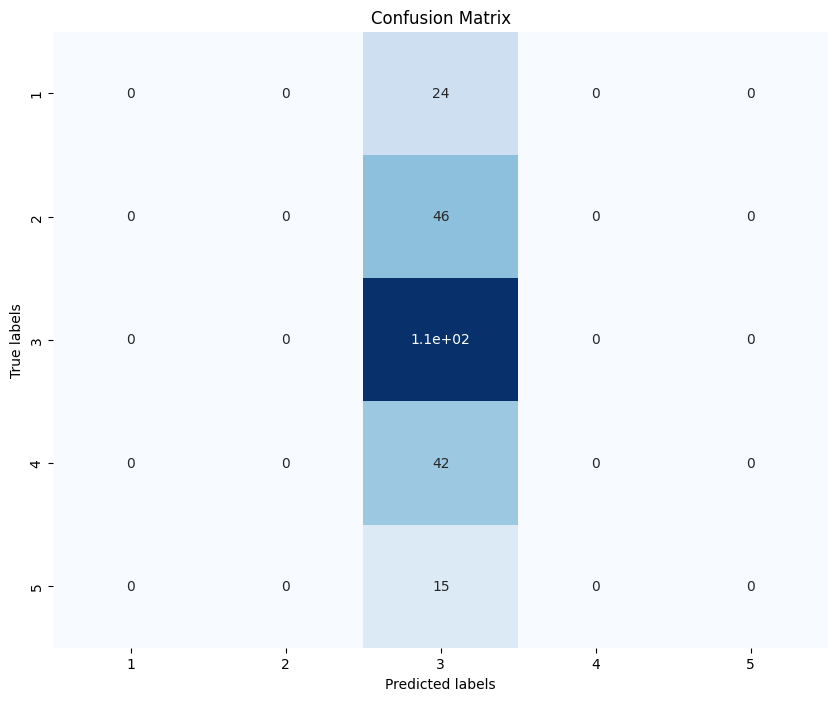

In [ ]:
labels = [1, 2, 3, 4, 5]

# ipython-input-195-ec9259d9cb7b
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert predictions and ground truth to class labels
#pred_classes = predictions  # This line was causing the error
#true_classes = y_test      # This line was causing the error
true_classes = np.argmax(y_test, axis=1)  # Get true class labels

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()

# ResNet50

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 256, 256, 1)

# Define ImageDataGenerator for Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,  # Rotate images by ±20 degrees
    width_shift_range=0.2,  # Shift horizontally by ±20%
    height_shift_range=0.2,  # Shift vertically by ±20%
    shear_range=0.2,  # Apply shear transformation
    zoom_range=0.2,  # Zoom in/out by ±20%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,  # Flip images vertically
    brightness_range=[0.8, 1.2],  # Adjust brightness between 80%-120%
    rescale=1./255  # Normalize pixel values to [0,1]
)

# Create a training generator
train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

print("Data augmentation setup complete!")


Data augmentation setup complete!


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
import cv2
import pandas as pd
num_classes=5


# Compute class weights for imbalance handling
y_train_labels = np.argmax(y_train, axis=1)  # Convert one-hot to labels
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_labels), y=y_train_labels)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Image Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

# ResNet50 Model
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze initial layers
for layer in base_model.layers[:]:
    layer.trainable = False

# Add new classification head
model = keras.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.4),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.4),
    layers.Dense(num_classes, activation="softmax")  # Output layer for 5 classes
])

# Compile the model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Early Stopping
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)

# Add the channels dimension (3 for RGB images)
#X_train = np.expand_dims(X_train, axis=-1) if X_train.ndim == 3 else X_train
X_val = np.expand_dims(X_val, axis=-1) if X_val.ndim == 3 else X_val
X_test = np.expand_dims(X_test, axis=-1) if X_test.ndim == 3 else X_test

# Ensure the shape is (num_samples, height, width, channels) in order for RenNet to work with these images
X_train = np.concatenate([X_train, X_train, X_train], axis=-1)  # Convert grayscale to RGB if needed
X_val = np.concatenate([X_val, X_val, X_val], axis=-1)
X_test = np.concatenate([X_test, X_test, X_test], axis=-1)

# Ensure the shape is (num_samples, 224, 224, 3)
assert X_train.shape[-1] == 3, f"Expected 3 channels, but got {X_train.shape[-1]}"

# Train model using data augmentation
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

history = model.fit(
    X_train, y_train,#train_generator,
    validation_data=(X_val, y_val),
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=[early_stopping],
    verbose=1
)

# Evaluate model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc:.4f}")


Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 38s 346ms/step - accuracy: 0.2113 - loss: 1.7740 - val_accuracy: 0.1653 - val_loss: 1.6243
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.1668 - loss: 1.6165 - val_accuracy: 0.1144 - val_loss: 1.6297
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - accuracy: 0.1857 - loss: 1.5926 - val_accuracy: 0.1271 - val_loss: 1.6174
Epoch 4/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 0.1740 - loss: 1.5842 - val_accuracy: 0.1907 - val_loss: 1.6168
Epoch 5/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.1649 - loss: 1.5841 - val_accuracy: 0.1059 - val_loss: 1.6172
Epoch 6/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.1517 - loss: 1.5838 - val_accuracy: 0.1059 - val_loss: 1.6175
Epoch 7/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.1236 - loss: 1.5841 - val_accuracy: 0.1059 - val_loss: 1.6172
Epoch 8/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - accuracy: 0.1432 - loss: 1.5842 - val_accuracy: 

Fine tuning:

In [ ]:
# Fine-tuning: Unfreeze the last few layers of the base ResNet50 model
# Unfreeze the last 4 residual blocks (or a different number, based on your needs)
for layer in base_model.layers[-4:]:  # Unfreeze the last 4 blocks
    layer.trainable = True

# Recompile the model after unfreezing
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.0001),  # Use a smaller learning rate for fine-tuning
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Now train the model with fine-tuning (we can either continue training from the previous model or restart)
history_finetune = model.fit(
    train_generator,
    validation_data=(X_val, y_val),
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=[early_stopping],
    verbose=1
)

# Evaluate the model after fine-tuning
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy after fine-tuning: {test_acc:.4f}")


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 49s 623ms/step - accuracy: 0.2074 - loss: 1.6645 - val_accuracy: 0.1920 - val_loss: 1.5737
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 448ms/step - accuracy: 0.1713 - loss: 1.6397 - val_accuracy: 0.1920 - val_loss: 1.5934
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 25s 445ms/step - accuracy: 0.1401 - loss: 1.6261 - val_accuracy: 0.1920 - val_loss: 1.5842
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 448ms/step - accuracy: 0.1441 - loss: 1.5974 - val_accuracy: 0.4643 - val_loss: 1.5989
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 25s 441ms/step - accuracy: 0.1694 - loss: 1.6112 - val_accuracy: 0.0670 - val_loss: 1.6030
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 446ms/step - accuracy: 0.1247 - loss: 1.5954 - val_accuracy: 0.1786 - val_loss: 1.6084
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 299ms/step - accuracy: 0.1691 - loss: 1.5762
Test Accuracy after fine-tuning: 0.1911


# ConvNeXt-Tiny

In [ ]:
import numpy as np
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
import tensorflow.keras.backend as K

# Ensure grayscale images have a channel dimension
# X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

print("X_train shape:", X_train_combined.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)

# Convert grayscale images to RGB (if needed)
if X_train_combined.shape[-1] == 1:
    X_train = np.repeat(X_train, 3, axis=-1)

if X_val.shape[-1] == 1:
    X_val = np.repeat(X_val, 3, axis=-1)

if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)

# Load ConvNeXtTiny model without top layers
convnext = ConvNeXtTiny(include_top=False, weights='imagenet', pooling='avg', input_shape=(224, 224, 3))
convnext.trainable = False  # Freeze all layers initially for transfer learning

# Build model on top of ConvNeXt
x = layers.Dense(64, activation='relu', name='dense')(convnext.output)
x = layers.Dropout(0.3, name='dropout')(x)

# Final output layer (5 classes)
outputs = layers.Dense(5, activation='softmax', name='output')(x)

# Create the model
model = models.Model(inputs=convnext.input, outputs=outputs, name='ConvNeXt_model')

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Print model summary
model.summary()

# Convert y_train to integer labels if one-hot encoded
y_train_integers = np.argmax(y_train_combined, axis=1)

# Compute class weights for handling imbalance
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_integers), y=y_train_integers)
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weight_dict)

# Scale inputs back to [0, 255] before training
X_train_combined = X_train_combined * 255
X_val = X_val * 255

# Train the model
history = model.fit(
    X_train_combined, y_train_combined,
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),
    callbacks=[EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

# Calculate and print best validation accuracy
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


X_train shape: (3780, 224, 224, 1)
X_val shape: (236, 224, 224, 1)
X_test shape: (237, 224, 224, 1)


Model: "ConvNeXt_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_prestem_no… │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stem        │ (None, 56, 56, 96)     │          4,896 │ convnext_tiny_prestem… │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │          4,800 │ convnext_tiny_stem[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │            192 │ convnext_tiny_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │         37,248 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │         36,960 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │             96 │ convnext_tiny_stage_0… │
│ (LayerScale)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stem[0]… │
│                           │                        │                │ convnext_tiny_stage_0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │          4,800 │ add[0][0]              │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │            192 │ convnext_tiny_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0

 Total params: 27,869,669 (106.31 MB)

 Trainable params: 49,541 (193.52 KB)

 Non-trainable params: 27,820,128 (106.13 MB)

Class Weights: {0: 1.9384615384615385, 1: 1.0327868852459017, 2: 0.4329896907216495, 3: 1.1317365269461077, 4: 3.098360655737705}
Epoch 1/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 54s 299ms/step - accuracy: 0.2009 - loss: 2.1185 - val_accuracy: 0.2076 - val_loss: 1.7328
Epoch 2/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - accuracy: 0.2198 - loss: 1.7576 - val_accuracy: 0.2119 - val_loss: 1.6855
Epoch 3/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - accuracy: 0.2295 - loss: 1.6391 - val_accuracy: 0.2161 - val_loss: 1.6489
Epoch 4/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - accuracy: 0.2461 - loss: 1.6137 - val_accuracy: 0.2246 - val_loss: 1.6276
Epoch 5/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - accuracy: 0.2367 - loss: 1.5719 - val_accuracy: 0.2119 - val_loss: 1.6184
Epoch 6/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - accuracy: 0.2642 - loss: 1.5493 - val_accuracy: 0.2161 - val_loss: 1.6231
Epoch 7/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - accuracy: 0.2

In [ ]:
%cd /content/drive/MyDrive/AI_project

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'multitumor_classes_fullslice_convnext_dataaug.keras'
model.save(model_filename)
print(f"Model saved as {model_filename} in /content/drive/MyDrive/AI_project")

# Free memory by deleting the model instance
del model

/content/drive/.shortcut-targets-by-id/1cZgPrYMBMZd9pUEvo9b_6Vm5-ifLGXPh/AI_project
Model saved as multitumor_classes_fullslice_convnext_dataaug.keras in /content/drive/MyDrive/AI_project


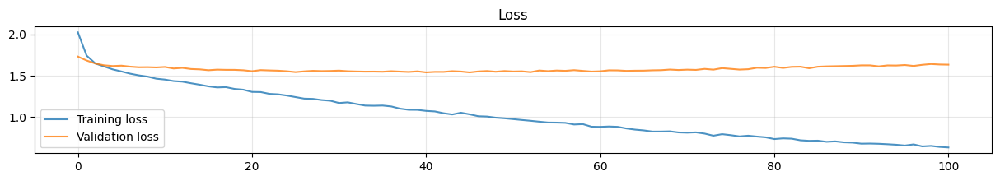

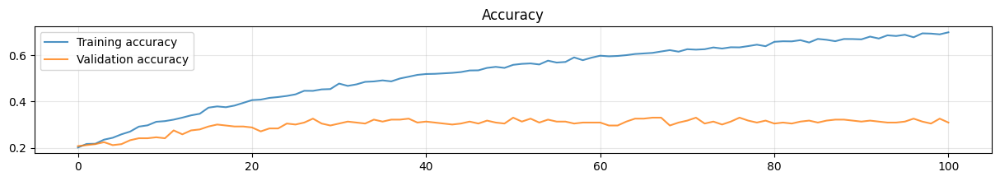

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Fine tuning:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

%cd /content/drive/MyDrive/AI_project

model = load_model('multitumor_classes_fullslice_convnext_dataaug.keras')

#Display summary
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

/content/drive/.shortcut-targets-by-id/1cZgPrYMBMZd9pUEvo9b_6Vm5-ifLGXPh/AI_project


Model: "ConvNeXt_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_prestem_no… │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stem        │ (None, 56, 56, 96)     │          4,896 │ convnext_tiny_prestem… │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │          4,704 │ -                      │
│ convnext_tiny_stem_conv   │                        │                │                        │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │            192 │ -                      │
│ convnext_tiny_stem_layer… │                        │                │                        │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │          4,800 │ convnext_tiny_stem[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │            192 │ convnext_tiny_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │         37,248 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │         36,960 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │             96 │ convnext_tiny_stage_0… │
│ (LayerScale)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stem[0]… │
│                      

 Total params: 27,968,753 (106.69 MB)

 Trainable params: 49,541 (193.52 KB)

 Non-trainable params: 27,820,128 (106.13 MB)

 Optimizer params: 99,084 (387.05 KB)

In [ ]:
# Set all layers in efficientnetb0 as trainable
model.trainable = True

# Set all layers as non-trainable
for layer in model.layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
       # print(i, layer.name, type(layer).__name__, layer.trainable)

# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(model.layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)


model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

0 input_layer False
1 convnext_tiny_prestem_normalization False
2 convnext_tiny_stem False
3 convnext_tiny_stage_0_block_0_depthwise_conv False
4 convnext_tiny_stage_0_block_0_layernorm False
5 convnext_tiny_stage_0_block_0_pointwise_conv_1 False
6 convnext_tiny_stage_0_block_0_gelu False
7 convnext_tiny_stage_0_block_0_pointwise_conv_2 False
8 convnext_tiny_stage_0_block_0_layer_scale False
9 convnext_tiny_stage_0_block_0_identity False
10 convnext_tiny_stage_0_block_1_depthwise_conv False
11 convnext_tiny_stage_0_block_1_layernorm False
12 convnext_tiny_stage_0_block_1_pointwise_conv_1 False
13 convnext_tiny_stage_0_block_1_gelu False
14 convnext_tiny_stage_0_block_1_pointwise_conv_2 False
15 convnext_tiny_stage_0_block_1_layer_scale False
16 convnext_tiny_stage_0_block_1_identity False
17 convnext_tiny_stage_0_block_2_depthwise_conv False
18 convnext_tiny_stage_0_block_2_layernorm False
19 convnext_tiny_stage_0_block_2_pointwise_conv_1 False
20 convnext_tiny_stage_0_block_2_gelu Fal

Model: "ConvNeXt_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_prestem_no… │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stem        │ (None, 56, 56, 96)     │          4,896 │ convnext_tiny_prestem… │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │          4,704 │ -                      │
│ convnext_tiny_stem_conv   │                        │                │                        │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │            192 │ -                      │
│ convnext_tiny_stem_layer… │                        │                │                        │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │          4,800 │ convnext_tiny_stem[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │            192 │ convnext_tiny_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │         37,248 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │         36,960 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │             96 │ convnext_tiny_stage_0… │
│ (LayerScale)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stem[0]… │
│                      

 Total params: 27,968,753 (106.69 MB)

 Trainable params: 38,400 (150.00 KB)

 Non-trainable params: 27,831,269 (106.17 MB)

 Optimizer params: 99,084 (387.05 KB)

In [ ]:
# Define the patience value for early stopping
patience = 40

# Create an EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True,
)

# Store the callback in a list
callbacks = [early_stopping]

In [ ]:
# Compile the model
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "ConvNeXt_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_prestem_no… │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stem        │ (None, 56, 56, 96)     │          4,896 │ convnext_tiny_prestem… │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │          4,704 │ -                      │
│ convnext_tiny_stem_conv   │                        │                │                        │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 56, 56, 96)     │            192 │ -                      │
│ convnext_tiny_stem_layer… │                        │                │                        │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │          4,800 │ convnext_tiny_stem[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │            192 │ convnext_tiny_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │         37,248 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 384)    │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │         36,960 │ convnext_tiny_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │             96 │ convnext_tiny_stage_0… │
│ (LayerScale)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_tiny_stage_0_bl… │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 96)     │              0 │ convnext_tiny_stem[0]… │
│                      

 Total params: 27,869,669 (106.31 MB)

 Trainable params: 38,400 (150.00 KB)

 Non-trainable params: 27,831,269 (106.17 MB)

In [ ]:
# Train the model
history = model.fit(
    X_train_combined, y_train_combined,
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history


# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')



Epoch 1/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 44s 222ms/step - accuracy: 0.5580 - loss: 0.9849 - val_accuracy: 0.3263 - val_loss: 1.5535
Epoch 2/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - accuracy: 0.5683 - loss: 0.9531 - val_accuracy: 0.3305 - val_loss: 1.5543
Epoch 3/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - accuracy: 0.5679 - loss: 0.9659 - val_accuracy: 0.3305 - val_loss: 1.5554
Epoch 4/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - accuracy: 0.5515 - loss: 0.9674 - val_accuracy: 0.3305 - val_loss: 1.5560
Epoch 5/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.5539 - loss: 0.9487 - val_accuracy: 0.3263 - val_loss: 1.5573
Epoch 6/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - accuracy: 0.5420 - loss: 0.9520 - val_accuracy: 0.3263 - val_loss: 1.5578
Epoch 7/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - accuracy: 0.5647 - loss: 0.9530 - val_accuracy: 0.3305 - val_loss: 1.5579
Epoch 8/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - accuracy: 

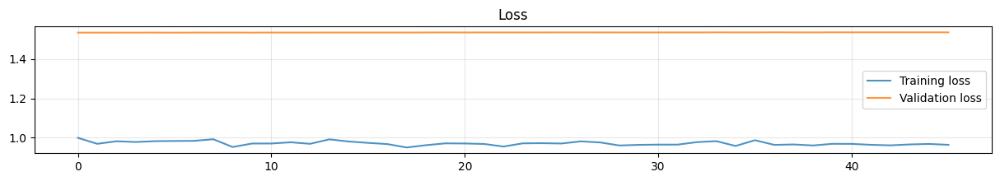

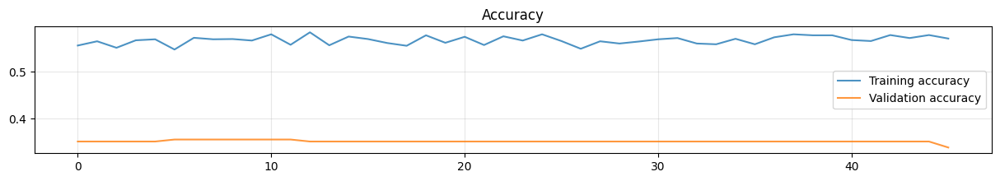

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
# Format the filename to avoid special character issues
# Replace decimal point in accuracy with underscore, or convert to an integer
formatted_accuracy = str(final_val_accuracy).replace('.', '_')
model_filename = 'multitumor_classes_fullslice_convnext_ft.keras'

# Save model to the Homework directory
model.save(model_filename)
print(f"Model saved as {model_filename}")

Model saved as multitumor_classes_fullslice_convnext_ft.keras


Make inference:

/content/drive/.shortcut-targets-by-id/1cZgPrYMBMZd9pUEvo9b_6Vm5-ifLGXPh/AI_project


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1          │ (None, 224, 224, 3)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ rescaling_2            │ (None, 224, 224, 3)  │            0 │ input_layer_1[0][0] │    -    │
│ (Rescaling)            │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ normalization_1        │ (None, 224, 224, 3)  │            7 │ rescaling_2[0][0]   │    N    │
│ (Normalization)        │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ rescaling_3            │ (None, 224, 224, 3)  │            0 │ normalization_1[0]… │    -    │
│ (Rescaling)            │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv_pad          │ (None, 225, 225, 3)  │            0 │ rescaling_3[0][0]   │    -    │
│ (ZeroPadding2D)        │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv (Conv2D)     │ (None, 112, 112, 32) │          864 │ stem_conv_pad[0][0] │    N    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_bn                │ (None, 112, 112, 32) │          128 │ stem_conv[0][0]     │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_activation        │ (None, 112, 112, 32) │            0 │ stem_bn[0][0]       │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_dwconv         │ (None, 112, 112, 32) │          288 │ stem_activation[0]… │    N    │
│ (DepthwiseConv2D)      │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_bn             │ (None, 112, 112, 32) │          128 │ block1a_dwconv[0][… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_activation     │ (None, 112, 112, 32) │            0 │ block1a_bn[0][0]    │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_squeeze     │ (None, 32)           │            0 │ block1a_activation… │    -    │
│ (GlobalAveragePooling… │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_reshape     │ (None, 1, 1, 32)     │            0 │ block1a_se_squeeze… │    -    │
│ (Reshape)              │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_reduce    

 Total params: 22,836,144 (87.11 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

 Optimizer params: 14,977,074 (57.13 MB)

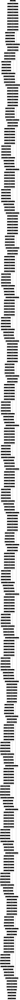

In [ ]:
%cd /content/drive/MyDrive/AI_project
# Load the saved model
model = tf.keras.models.load_model('multitumor_classes_fullslice_convnext_ft.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tf.keras.utils.plot_model(model, show_shapes=True, dpi=70)

Rirunnare split e poi questo:

In [ ]:
# Ensure grayscale images have a channel dimension
X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)


# Convert grayscale images to RGB (if needed)
if X_train.shape[-1] == 1:
    X_train = np.repeat(X_train, 3, axis=-1)

if X_val.shape[-1] == 1:
    X_val = np.repeat(X_val, 3, axis=-1)

if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)

X_train=X_train*255
X_val=X_val*255


X_train shape: (1890, 224, 224, 1)
X_val shape: (236, 224, 224, 1)
X_test shape: (237, 224, 224, 1)


In [ ]:
# ipython-input-193-ec9259d9cb7b
# Predict labels for the entire test set
predictions = model.predict(X_test*255, verbose=0)
#predictions=(model.predict(X_test*255) > 0.5).astype("int32") # This line was causing the error
pred_classes = np.argmax(predictions, axis=1)  # Get predicted class labels
# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (237, 5)


In [ ]:
labels = ['1','2','3','4','5']

Accuracy score over the test set: 0.2785
Precision score over the test set: 0.3347
Recall score over the test set: 0.2785
F1 score over the test set: 0.2941


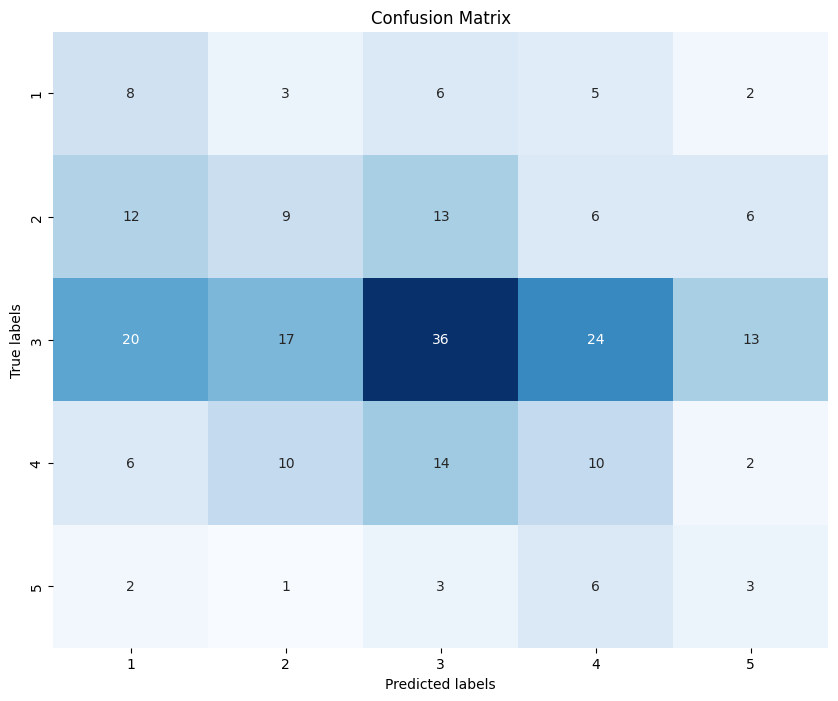

In [ ]:
# ipython-input-195-ec9259d9cb7b
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert predictions and ground truth to class labels
#pred_classes = predictions  # This line was causing the error
#true_classes = y_test      # This line was causing the error
true_classes = np.argmax(y_test, axis=1)  # Get true class labels

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()

# EfficientNet

In [ ]:
!pip install keras-cv
from keras.applications import EfficientNetB2
import keras_cv
input_shape = (224, 224, 3)

efficient=EfficientNetB2(include_top=False, weights='imagenet',  pooling='avg', input_shape=input_shape)
efficient.trainable=False # Freeze all layers for initial transfer learning


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 39.6 MB/s eta 0:00:00
31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
import numpy as np
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import backend as K


# Ensure grayscale images have a channel dimension
# Da saltare solo in caso abbia runnato la sezione upsampling
#X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
#X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
#X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

#print("X_train shape:", X_train.shape)
#print("X_val shape:", X_val.shape)
#print("X_test shape:", X_test.shape)


# Convert grayscale images to RGB (if needed)
if X_train.shape[-1] == 1:
    X_train = np.repeat(X_train, 3, axis=-1)

if X_val.shape[-1] == 1:
    X_val = np.repeat(X_val, 3, axis=-1)

if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)

# Load EfficientNetB2 model without top layers
efficient = EfficientNetB2(include_top=False, weights='imagenet', pooling='avg', input_shape=(224, 224, 3))
efficient.trainable = False  # Freeze all layers for initial transfer learning

# Build model on top of EfficientNetB2
x = layers.Dense(64, activation='relu', name='dense')(efficient.output)
x = layers.Dropout(0.3, name='dropout')(x)

# Add a final Dense layer for classification (5 classes)
outputs = layers.Dense(5, activation='softmax', name='output')(x)

# Create the model
model = models.Model(inputs=efficient.input, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(
    loss='categorical_crossentropy',  # If y_train is one-hot encoded
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Print model summary
model.summary()

# Convert y_train to integer labels if it is one-hot encoded
y_train_integers = np.argmax(y_train, axis=1)  # If y_train is one-hot encoded

# Calculate class weights for handling class imbalance
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_integers), y=y_train_integers)

# Convert the class weights to a dictionary for use in model training
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weight_dict)

X_train=X_train*255
X_val=X_val*255

# Train the model
history = model.fit(
    X_train, y_train,  # Ensure y_train is correctly formatted
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),  # Ensure y_val is correctly formatted
    callbacks=[EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 7,859,070 (29.98 MB)

 Trainable params: 90,501 (353.52 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

Class Weights: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}
Epoch 1/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.2587 - loss: 1.6083 - val_accuracy: 0.4703 - val_loss: 1.4248
Epoch 2/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3453 - loss: 1.4840 - val_accuracy: 0.4661 - val_loss: 1.3992
Epoch 3/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3890 - loss: 1.4381 - val_accuracy: 0.4703 - val_loss: 1.3851
Epoch 4/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.4030 - loss: 1.4115 - val_accuracy: 0.4619 - val_loss: 1.3787
Epoch 5/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.4148 - loss: 1.3918 - val_accuracy: 0.4661 - val_loss: 1.3769
Epoch 6/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.4217 - loss: 1.3801 - val_accuracy: 0.4661 - val_loss: 1.3760
Epoch 7/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.4452 - loss: 1.3538 - val_accuracy: 0.4661 - val_loss: 1.3656
Epoch 8/1000
153/153 ━━━━

In [ ]:
%cd /content/drive/MyDrive/Applied AI/Carlotta

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'multitumor_classes_fullslice_efficientnet_upsampling.keras'
model.save(model_filename)
print(f"Model saved as {model_filename} in /content/drive/MyDrive/AI_project")

# Free memory by deleting the model instance
del model

/content/drive/MyDrive/Applied AI/Carlotta


NameError: name 'model' is not defined

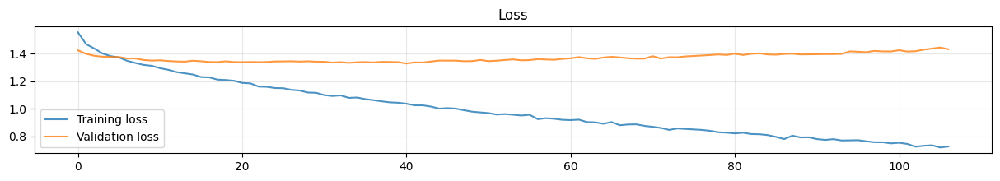

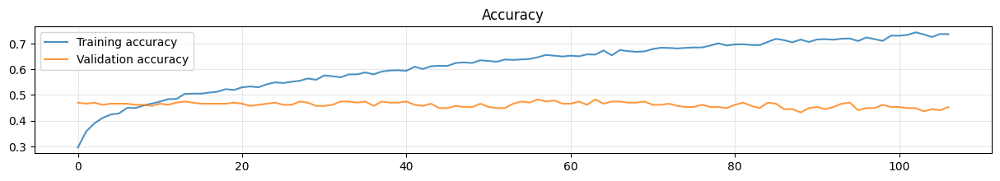

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Fine tuning:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

%cd /content/drive/MyDrive/Applied AI/Carlotta

model = load_model('multitumor_classes_fullslice_efficientnet_upsampling.keras')

#Display summary
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

/content/drive/MyDrive/Applied AI/Carlotta


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 8,040,074 (30.67 MB)

 Trainable params: 90,501 (353.52 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

 Optimizer params: 181,004 (707.05 KB)

In [ ]:
# Set all layers in efficientnetb0 as trainable
model.trainable = True

# Set all layers as non-trainable
for layer in model.layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
       # print(i, layer.name, type(layer).__name__, layer.trainable)

# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(model.layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)


model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

0 input_layer_1 False
1 rescaling_2 False
2 normalization_1 False
3 rescaling_3 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block1b_dwconv False
19 block1b_bn False
20 block1b_activation False
21 block1b_se_squeeze False
22 block1b_se_reshape False
23 block1b_se_reduce False
24 block1b_se_expand False
25 block1b_se_excite False
26 block1b_project_conv False
27 block1b_project_bn False
28 block1b_drop False
29 block1b_add False
30 block2a_expand_conv False
31 block2a_expand_bn False
32 block2a_expand_activation False
33 block2a_dwconv_pad False
34 block2a_dwconv False
35 block2a_bn False
36 block2a_activation False
37 block2a_se_squeeze False
38 block2a_se_reshape False
39 block2a_s

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 8,040,074 (30.67 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

 Optimizer params: 181,004 (707.05 KB)

In [ ]:
# Define the patience value for early stopping
patience = 40

# Create an EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True,
)

# Store the callback in a list
callbacks = [early_stopping]

In [ ]:
# Compile the model
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 7,859,070 (29.98 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

In [ ]:
# Train the model
history = model.fit(
    X_train, y_train,
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history


# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')



Epoch 1/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 92s 252ms/step - accuracy: 0.6407 - loss: 0.9330 - val_accuracy: 0.4619 - val_loss: 1.3905
Epoch 2/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.6637 - loss: 0.8824 - val_accuracy: 0.4534 - val_loss: 1.3892
Epoch 3/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.6840 - loss: 0.8233 - val_accuracy: 0.4576 - val_loss: 1.4067
Epoch 4/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.7110 - loss: 0.7726 - val_accuracy: 0.4746 - val_loss: 1.4149
Epoch 5/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.7278 - loss: 0.7387 - val_accuracy: 0.4746 - val_loss: 1.4124
Epoch 6/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.7311 - loss: 0.7183 - val_accuracy: 0.4534 - val_loss: 1.4612
Epoch 7/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.7506 - loss: 0.6783 - val_accuracy: 0.4576 - val_loss: 1.4634
Epoch 8/1000
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.7573 - loss:

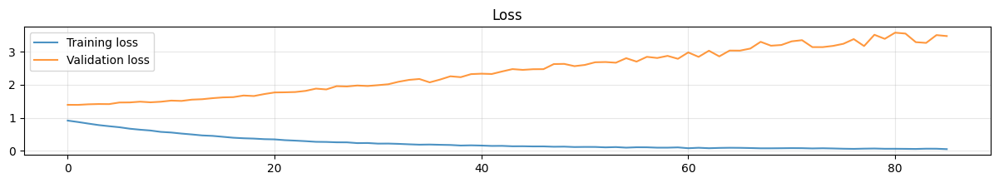

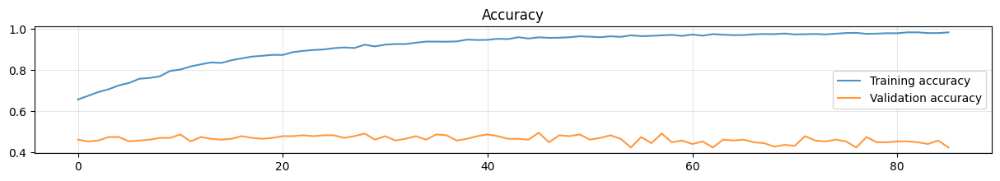

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
# Format the filename to avoid special character issues
# Replace decimal point in accuracy with underscore, or convert to an integer
formatted_accuracy = str(final_val_accuracy).replace('.', '_')
model_filename = 'multitumor_classes_fullslice_efficientnet_upsampling_ft.keras'

# Save model to the Homework directory
model.save(model_filename)
print(f"Model saved as {model_filename}")

Model saved as multitumor_classes_fullslice_efficientnet_upsampling_ft.keras


Make inference:

/content/drive/MyDrive/Applied AI/Carlotta


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1          │ (None, 224, 224, 3)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ rescaling_2            │ (None, 224, 224, 3)  │            0 │ input_layer_1[0][0] │    -    │
│ (Rescaling)            │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ normalization_1        │ (None, 224, 224, 3)  │            7 │ rescaling_2[0][0]   │    N    │
│ (Normalization)        │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ rescaling_3            │ (None, 224, 224, 3)  │            0 │ normalization_1[0]… │    -    │
│ (Rescaling)            │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv_pad          │ (None, 225, 225, 3)  │            0 │ rescaling_3[0][0]   │    -    │
│ (ZeroPadding2D)        │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv (Conv2D)     │ (None, 112, 112, 32) │          864 │ stem_conv_pad[0][0] │    N    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_bn                │ (None, 112, 112, 32) │          128 │ stem_conv[0][0]     │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_activation        │ (None, 112, 112, 32) │            0 │ stem_bn[0][0]       │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_dwconv         │ (None, 112, 112, 32) │          288 │ stem_activation[0]… │    N    │
│ (DepthwiseConv2D)      │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_bn             │ (None, 112, 112, 32) │          128 │ block1a_dwconv[0][… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_activation     │ (None, 112, 112, 32) │            0 │ block1a_bn[0][0]    │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_squeeze     │ (None, 32)           │            0 │ block1a_activation… │    -    │
│ (GlobalAveragePooling… │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_reshape     │ (None, 1, 1, 32)     │            0 │ block1a_se_squeeze… │    -    │
│ (Reshape)              │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_se_reduce    

 Total params: 22,836,144 (87.11 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

 Optimizer params: 14,977,074 (57.13 MB)

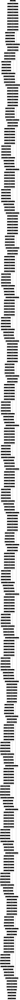

In [ ]:
%cd /content/drive/MyDrive/Applied AI/Carlotta
# Load the saved model
model = tf.keras.models.load_model('multitumor_classes_fullslice_efficientnet_upsampling_ft.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tf.keras.utils.plot_model(model, show_shapes=True, dpi=70)

Rirunnare Split e poi questo per avere le dimensioni corrette:

In [ ]:
# Ensure grayscale images have a channel dimension
#X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
#X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
#X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)


# Convert grayscale images to RGB (if needed)
if X_train.shape[-1] == 1:
    X_train = np.repeat(X_train, 3, axis=-1)

if X_val.shape[-1] == 1:
    X_val = np.repeat(X_val, 3, axis=-1)

if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)

X_train=X_train*255
X_val=X_val*255


X_train shape: (1890, 224, 224, 1)
X_val shape: (236, 224, 224, 1)
X_test shape: (237, 224, 224, 1)


In [ ]:
# ipython-input-193-ec9259d9cb7b
# Predict labels for the entire test set
predictions = model.predict(X_test*255, verbose=0)
#predictions=(model.predict(X_test*255) > 0.5).astype("int32") # This line was causing the error
pred_classes = np.argmax(predictions, axis=1)  # Get predicted class labels
# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (237, 5)


In [ ]:
labels = ['1','2','3','4','5']

Accuracy score over the test set: 0.4219
Precision score over the test set: 0.3906
Recall score over the test set: 0.4219
F1 score over the test set: 0.3949


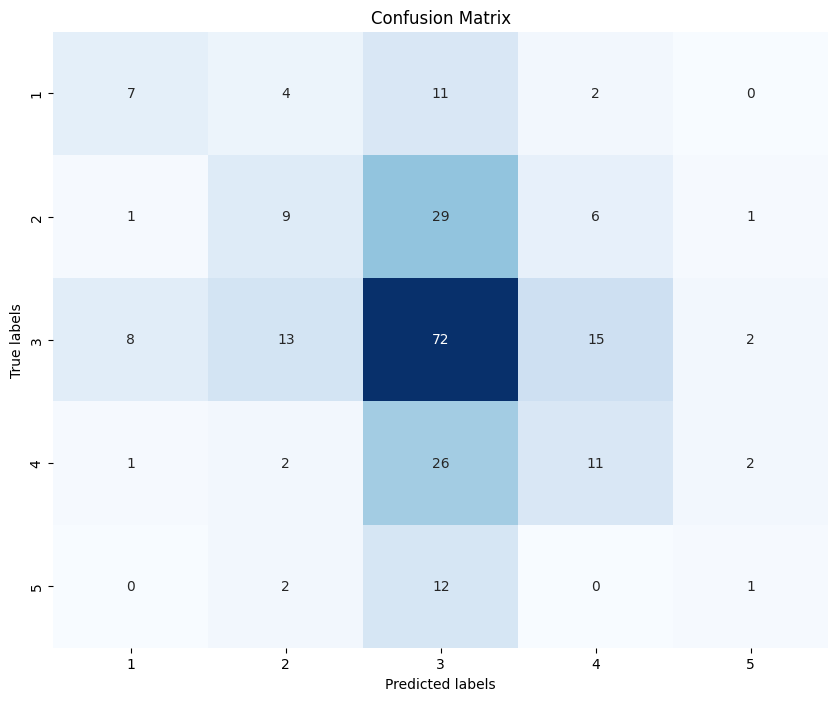

In [ ]:
# ipython-input-195-ec9259d9cb7b
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert predictions and ground truth to class labels
#pred_classes = predictions  # This line was causing the error
#true_classes = y_test      # This line was causing the error
true_classes = np.argmax(y_test, axis=1)  # Get true class labels

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import numpy as np
import tensorflow as tf

def compute_confidence_metrics_numpy(model, X_test, y_test):
    """
    Computes confidence estimation based on predicted and true labels for a NumPy dataset.

    Args:
        model (tf.keras.Model): Trained Keras model.
        X_test (np.array): NumPy array of test images (N, H, W, C).
        y_test (np.array): One-hot encoded true labels (N, num_classes).

    Returns:
        pred_confidence (dict): Average confidence per predicted class.
        true_confidence (dict): Average confidence per true class.
    """
    # Convert one-hot encoded labels to class indices
    y_test = np.argmax(y_test, axis=1)  # Shape: (N,)

    # Get softmax probabilities from model
    softmax_probs = model.predict(X_test, verbose=0)  # Shape: (N, num_classes)
    predicted_labels = np.argmax(softmax_probs, axis=1)  # Model predictions

    num_classes = softmax_probs.shape[1]

    # Store confidence values for each class
    pred_confidence = {}
    true_confidence = {}

    for c in range(num_classes):
        # Confidence per predicted class
        pred_indices = np.where(predicted_labels == c)[0]  # Indices where model predicted class c
        if len(pred_indices) > 0:
            pred_confidence[c] = np.mean(softmax_probs[pred_indices, c])  # Avg softmax for predicted class

        # Confidence per true class
        true_indices = np.where(y_test == c)[0]  # Indices where true label is class c
        if len(true_indices) > 0:
            true_confidence[c] = np.mean(softmax_probs[true_indices, c])  # Avg softmax for true class

    return pred_confidence, true_confidence

# Example Usage:
# Assuming 'X_test' is your NumPy array of test images and 'y_test' contains the true labels (one-hot encoded)
pred_conf, true_conf = compute_confidence_metrics_numpy(model, X_test*255, y_test)

# Print results
print("Confidence based on Predicted Labels:", pred_conf)
print("Confidence based on True Labels:", true_conf)


Confidence based on Predicted Labels: {0: 0.8061313, 1: 0.73407876, 2: 0.85817, 3: 0.72429454, 4: 0.7063393}
Confidence based on True Labels: {0: 0.29234293, 1: 0.20201239, 2: 0.63334686, 3: 0.27393085, 4: 0.058621515}


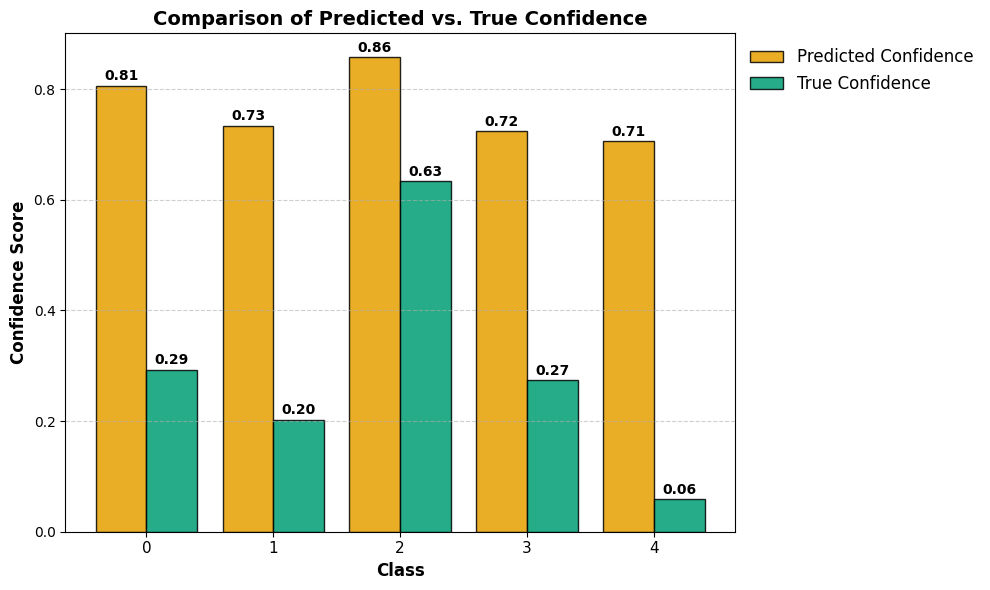

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert dictionaries to lists for plotting
classes = list(pred_conf.keys())  # Assuming same keys for both
predicted_conf = [pred_conf[c] for c in classes]
true_conf = [true_conf[c] for c in classes]

# Define width for bars
bar_width = 0.4
x_indexes = np.arange(len(classes))

# Create figure
plt.figure(figsize=(10, 6))

# Define custom colors
predicted_color = "#E69F00"  # Orange
true_color = "#009E73"  # Green

# Plot bars with rounded edges
bars1 = plt.bar(x_indexes - bar_width/2, predicted_conf, width=bar_width, color=predicted_color, edgecolor='black', label="Predicted Confidence", alpha=0.85)
bars2 = plt.bar(x_indexes + bar_width/2, true_conf, width=bar_width, color=true_color, edgecolor='black', label="True Confidence", alpha=0.85)

# Add labels above bars
for bar in bars1:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{bar.get_height():.2f}",
             ha='center', fontsize=10, fontweight='bold', color='black')

for bar in bars2:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{bar.get_height():.2f}",
             ha='center', fontsize=10, fontweight='bold', color='black')

# Labels and title
plt.xlabel("Class", fontsize=12, fontweight='bold')
plt.ylabel("Confidence Score", fontsize=12, fontweight='bold')
plt.title("Comparison of Predicted vs. True Confidence", fontsize=14, fontweight='bold')

# X-axis labels
plt.xticks(x_indexes, classes, fontsize=11)

# Add grid for readability
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Move legend outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12, frameon=False)

# Improve layout to fit legend outside
plt.tight_layout()

# Show plot
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def compute_confidence_distribution(model, X_test, y_test):
    """
    Computes the distribution of confidence for predicted labels.

    Args:
        model (tf.keras.Model): Trained Keras model.
        X_test (np.array): NumPy array of test images (N, H, W, C).
        y_test (np.array): One-hot encoded true labels (N, num_classes).

    Returns:
        pred_confidence_dist (list): Confidence values for each prediction.
    """
    # Get softmax probabilities from the model
    softmax_probs = model.predict(X_test, verbose=0)  # Shape: (N, num_classes)
    predicted_labels = np.argmax(softmax_probs, axis=1)  # Model predictions

    # Confidence values for predicted labels (maximum softmax probability for each prediction)
    pred_confidence_dist = [softmax_probs[i, predicted_labels[i]] for i in range(len(predicted_labels))]

    return pred_confidence_dist

# Example Usage
# Assuming 'X_test' is your test data and 'y_test' contains the true labels (one-hot encoded)
pred_confidence_dist = compute_confidence_distribution(model, X_test*255, y_test)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Compute mean confidence value
mean_confidence = np.mean(pred_confidence_dist)

# Create histogram
plt.figure(figsize=(10, 6))
plt.hist(pred_confidence_dist, bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.axvline(mean_confidence, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_confidence:.2f}')

# Labels and title
plt.xlabel("Confidence", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.title("Distribution of Confidence for Predicted Labels", fontsize=16)

# Grid and legend
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Show plot
plt.show()

# Print mean confidence value
print('Mean confidence value:', mean_confidence)


# Explainability

[0. 0. 1. 0. 0.]
[8.2519423e-04 1.7732546e-03 9.9624795e-01 1.1536158e-03 1.5972123e-08]


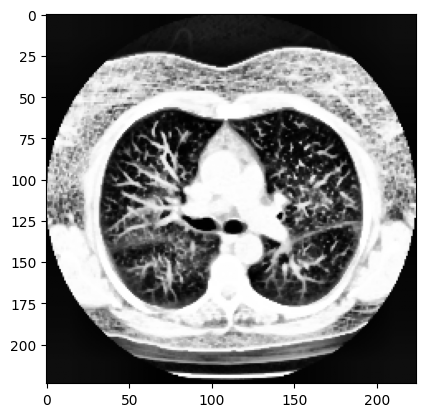

In [ ]:
idx=30
print(y_test[idx])
print(predictions[idx])
image=X_test[idx]

plt.imshow(image[:,:,0], cmap='gray')
plt.show()

GRADCAM:

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model

def GradCam(model, img_array, layer_name, eps=1e-8, target_class=0):
    """
    Calcola separatamente la Grad-CAM heatmap e le predizioni utilizzando due modelli differenti.

    Args:
      model_gradcam: Modello (o submodello) utilizzato per il calcolo della Grad-CAM.
                     Es. la parte del modello che include EfficientNetB2.
      model_pred:    Modello completo utilizzato per ottenere le predizioni.
      img_array:     Immagine pre-elaborata (numpy array con shape [batch, height, width, channels]).
      layer_name:    Nome del layer (in model_gradcam) da cui calcolare la Grad-CAM.
      eps:           Valore per evitare divisioni per zero nella normalizzazione.

    Returns:
      heatmap:      Numpy array della Grad-CAM normalizzato (shape: [img_height, img_width]).
      predictions:  Predizioni ottenute da model_pred.
    """

    # --- Creazione del modello per la Grad-CAM ---
    # Estrae l'output del layer specificato all'interno di model_gradcam
    conv_layer = model.get_layer(layer_name).output
    gradModel = Model(inputs=model.input, outputs=[conv_layer, model.output])

    # --- Calcolo delle predizioni con il modello separato ---
    predictions = model.predict(img_array)

    # --- Calcolo della Grad-CAM ---
    with tf.GradientTape() as tape:
        # Assicuriamoci che l'input sia in formato float32
        inputs = tf.cast(img_array, tf.float32)
        # Eseguiamo il modello per ottenere:
        # - convOutputs: le feature maps del layer di interesse
        # - predictions_grad: l'output di model_gradcam (usato per il calcolo dei gradienti)
        convOutputs, predictions_grad = gradModel(inputs)
        # Scegliamo una classe target (qui ad esempio la prima classe, indice 0)
        loss = predictions_grad[:, target_class]

    # Calcola i gradienti della loss rispetto alle feature maps
    grads = tape.gradient(loss, convOutputs)

    # Applica la tecnica di guided backpropagation: considera solo i valori positivi
    castConvOutputs = tf.cast(convOutputs > 0, "float32")
    castGrads = tf.cast(grads > 0, "float32")
    guidedGrads = castConvOutputs * castGrads * grads

    # Rimuovi la dimensione batch (si assume di avere un'unica immagine)
    convOutputs = convOutputs[0]
    guidedGrads = guidedGrads[0]

    # Calcola i pesi mediando i gradienti lungo le dimensioni spaziali (height e width)
    weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
    # Combina i pesi con le feature maps per ottenere la mappa di attivazione (CAM)
    cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

    # Ridimensiona la mappa alle dimensioni originali dell'immagine
    (w, h) = (img_array.shape[2], img_array.shape[1])
    heatmap = cv2.resize(cam.numpy(), (w, h))

    # Normalizza la heatmap in modo che i valori siano compresi tra 0 e 1
    numer = heatmap - np.min(heatmap)
    denom = (heatmap.max() - heatmap.min()) + eps
    heatmap = numer / denom

    return heatmap, predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


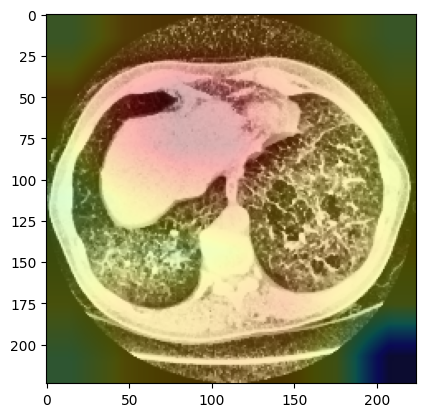

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib import cm  # Import cm from matplotlib
import matplotlib.gridspec as gridspec  # Import gridspec from Matplotlib



def sigmoid(x, a, b, c):
  return c / (1 + np.exp(-a * (x-b)))

def display_gradcam(img, heatmap):
    # Load the original image
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = plt.colormaps.get_cmap("jet")  # New recommended approach

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))

    #heatmap = sigmoid(heatmap, 50, thresh, 1)

    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Display Grad CAM
    plt.imshow(superimposed_img)

layer_name = 'top_conv' # try also 'conv5_block32_concat'
grad_cam,predictions_grad=GradCam(model,np.expand_dims(X_test[2]*255, axis=0),layer_name)
display_gradcam(X_test[2]*255, grad_cam)

In [ ]:
for layer in model.layers:
    print(layer.name)

input_layer_1
rescaling_2
normalization_1
rescaling_3
stem_conv_pad
stem_conv
stem_bn
stem_activation
block1a_dwconv
block1a_bn
block1a_activation
block1a_se_squeeze
block1a_se_reshape
block1a_se_reduce
block1a_se_expand
block1a_se_excite
block1a_project_conv
block1a_project_bn
block1b_dwconv
block1b_bn
block1b_activation
block1b_se_squeeze
block1b_se_reshape
block1b_se_reduce
block1b_se_expand
block1b_se_excite
block1b_project_conv
block1b_project_bn
block1b_drop
block1b_add
block2a_expand_conv
block2a_expand_bn
block2a_expand_activation
block2a_dwconv_pad
block2a_dwconv
block2a_bn
block2a_activation
block2a_se_squeeze
block2a_se_reshape
block2a_se_reduce
block2a_se_expand
block2a_se_excite
block2a_project_conv
block2a_project_bn
block2b_expand_conv
block2b_expand_bn
block2b_expand_activation
block2b_dwconv
block2b_bn
block2b_activation
block2b_se_squeeze
block2b_se_reshape
block2b_se_reduce
block2b_se_expand
block2b_se_excite
block2b_project_conv
block2b_project_bn
block2b_drop
block

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


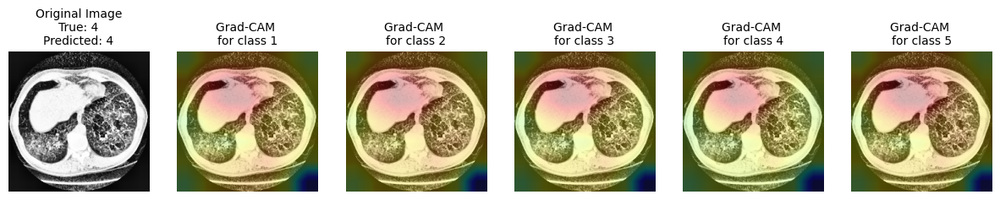

In [ ]:

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from tensorflow.keras.models import Model
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec  # Import gridspec


layer_name='top_conv'
idx= 2

def display_gradcam(img, heatmap):
    img = tf.keras.preprocessing.image.img_to_array(img)
    heatmap = np.uint8(255 * heatmap)
    jet = plt.colormaps.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
    superimposed_img = jet_heatmap * 0.4 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    return superimposed_img


def plot_gradcam_with_image(idx):
    fig = plt.figure(figsize=(15, 7))
    outer = gridspec.GridSpec(1, 6, wspace=0.2, hspace=0.2)

    # Original Image
    ax = plt.Subplot(fig, outer[0])
    ax.imshow(X_test[idx])
    ax.set_title(f"Original Image\nTrue: {labels[np.argmax(y_test[idx])]}\nPredicted: {labels[np.argmax(predictions[idx])]}", size=10)
    ax.axis('off')
    fig.add_subplot(ax)

    for i in range(5):
        grad_cam, _ = GradCam(model, np.expand_dims(X_test[idx]*255, axis=0), layer_name, target_class=i)
        ax = plt.Subplot(fig, outer[i+1])
        superimposed_image = display_gradcam(X_test[idx] * 255, grad_cam)
        ax.imshow(superimposed_image)
        ax.set_title(f"Grad-CAM \nfor class {labels[i]}", size=10)
        ax.axis('off')
        fig.add_subplot(ax)
    plt.show()

plot_gradcam_with_image(idx)

Per un'immagine classificata correttamente:

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


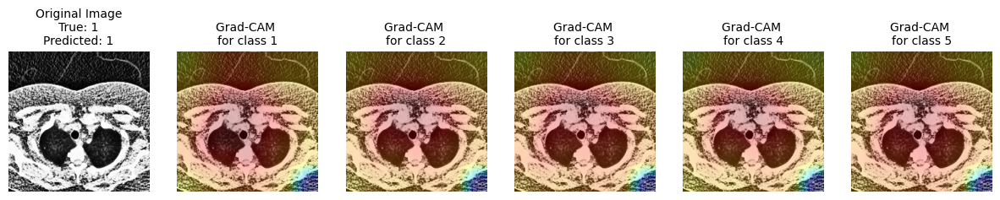

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import tensorflow as tf

layer_name = 'top_conv'

def display_gradcam(img, heatmap):
    img = tf.keras.preprocessing.image.img_to_array(img)
    heatmap = np.uint8(255 * heatmap)
    jet = plt.colormaps.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
    superimposed_img = jet_heatmap * 0.4 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    return superimposed_img


def plot_gradcam_correct():
    # Trova gli indici delle immagini correttamente classificate
    correct_indices = np.where(np.argmax(y_test, axis=1) == np.argmax(predictions, axis=1))[0]

    if len(correct_indices) == 0:
        print("Nessuna immagine classificata correttamente trovata.")
        return

    # Scegli un indice a caso tra quelli corretti
    idx = np.random.choice(correct_indices)

    fig = plt.figure(figsize=(15, 7))
    outer = gridspec.GridSpec(1, 6, wspace=0.2, hspace=0.2)

    # Immagine originale
    ax = plt.Subplot(fig, outer[0])
    ax.imshow(X_test[idx])
    ax.set_title(f"Original Image\nTrue: {labels[np.argmax(y_test[idx])]}\nPredicted: {labels[np.argmax(predictions[idx])]}", size=10)
    ax.axis('off')
    fig.add_subplot(ax)

    # Genera Grad-CAM per ogni classe
    for i in range(5):
        grad_cam, _ = GradCam(model, np.expand_dims(X_test[idx] * 255, axis=0), layer_name, target_class=i)
        ax = plt.Subplot(fig, outer[i+1])
        superimposed_image = display_gradcam(X_test[idx] * 255, grad_cam)
        ax.imshow(superimposed_image)
        ax.set_title(f"Grad-CAM \nfor class {labels[i]}", size=10)
        ax.axis('off')
        fig.add_subplot(ax)

    plt.show()

# Chiamata alla funzione per visualizzare un Grad-CAM su un'immagine corretta
plot_gradcam_correct()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
import numpy as np
from tensorflow.keras.models import Model
import tensorflow as tf
import cv2

def sigmoid(x, a, b, c):
    return c / (1 + np.exp(-a * (x - b)))

def display_gradcam(img, heatmap):
    # Load the original image
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")  # Use the imported cm module

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))

    # heatmap = sigmoid(heatmap, 50, thresh, 1)

    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img
    # changed from superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

    # Return superimposed_img
    return superimposed_img

layer_name = 'top_conv'  # Replace with your layer name
target_class = 3  # Class index for Grad-CAM

fig = plt.figure(figsize=(15, 7))
outer = gridspec.GridSpec(1, 10, wspace=0.2, hspace=0.2)  # Adjust the number of columns

for i in range(10):
    idx = i  # Select indices from test set
    grad_cam, _ = GradCam(model, np.expand_dims(X_test[idx] * 255, axis=0), layer_name, target_class=np.argmax(predictions[idx]))
    ax = plt.Subplot(fig, outer[i])
    superimposed_image = display_gradcam(X_test[idx] * 255, grad_cam)
    ax.imshow(superimposed_image)
    ax.set_title(f"Image {i + 1}\nTrue: {labels[np.argmax(y_test[idx])]}\nPredicted: {labels[np.argmax(predictions[idx])]}", size=8)
    ax.axis('off')
    fig.add_subplot(ax)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


<ipython-input-98-a030657d7dec>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")  # Use the imported cm module


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


# EfficientNet con augmentation

In [ ]:
!pip install keras-cv
from keras.applications import EfficientNetB2
import keras_cv
input_shape = (224, 224, 3)

efficient=EfficientNetB2(include_top=False, weights='imagenet',  pooling='avg', input_shape=input_shape)
efficient.trainable=False # Freeze all layers for initial transfer learning


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 37.3 MB/s eta 0:00:00
31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
import numpy as np
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import backend as K


# Ensure grayscale images have a channel dimension
#X_train = np.expand_dims(X_train, axis=-1)  # Shape: (1795, 224, 224, 1)
X_val = np.expand_dims(X_val, axis=-1)  # Shape: (224, 224, 224, 1)
X_test = np.expand_dims(X_test, axis=-1)  # Shape: (225, 224, 224, 1)

print("X_train_combined shape:", X_train_combined.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)


# Convert grayscale images to RGB (if needed)
if X_train_combined.shape[-1] == 1:
    X_train = np.repeat(X_train, 3, axis=-1)

if X_val.shape[-1] == 1:
    X_val = np.repeat(X_val, 3, axis=-1)

if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)

# Load EfficientNetB2 model without top layers
efficient = EfficientNetB2(include_top=False, weights='imagenet', pooling='avg', input_shape=(224, 224, 3))
efficient.trainable = False  # Freeze all layers for initial transfer learning

# Build model on top of EfficientNetB2
x = layers.Dense(64, activation='relu', name='dense')(efficient.output)
x = layers.Dropout(0.3, name='dropout')(x)

# Add a final Dense layer for classification (5 classes)
outputs = layers.Dense(5, activation='softmax', name='output')(x)

# Create the model
model = models.Model(inputs=efficient.input, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(
    loss='categorical_crossentropy',  # If y_train is one-hot encoded
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Print model summary
model.summary()

# Convert y_train to integer labels if it is one-hot encoded
y_train_integers = np.argmax(y_train_combined, axis=1)  # If y_train is one-hot encoded

# Calculate class weights for handling class imbalance
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_integers), y=y_train_integers)

# Convert the class weights to a dictionary for use in model training
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weight_dict)

X_train_combined=X_train_combined*255
X_val=X_val*255

# Train the model
history = model.fit(
    X_train_combined, y_train_combined,  # Ensure y_train is correctly formatted
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),  # Ensure y_val is correctly formatted
    callbacks=[EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


X_train_combined shape: (3780, 224, 224, 1)
X_val shape: (236, 224, 224, 1)
X_test shape: (237, 224, 224, 1)


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 7,859,070 (29.98 MB)

 Trainable params: 90,501 (353.52 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

Class Weights: {0: 1.9384615384615385, 1: 1.0327868852459017, 2: 0.4329896907216495, 3: 1.1317365269461077, 4: 3.098360655737705}
Epoch 1/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 79s 337ms/step - accuracy: 0.1885 - loss: 1.6561 - val_accuracy: 0.2331 - val_loss: 1.5918
Epoch 2/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - accuracy: 0.2248 - loss: 1.5882 - val_accuracy: 0.2331 - val_loss: 1.5820
Epoch 3/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - accuracy: 0.2381 - loss: 1.5605 - val_accuracy: 0.2458 - val_loss: 1.5662
Epoch 4/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - accuracy: 0.2418 - loss: 1.5572 - val_accuracy: 0.2627 - val_loss: 1.5531
Epoch 5/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - accuracy: 0.2733 - loss: 1.5322 - val_accuracy: 0.2373 - val_loss: 1.5569
Epoch 6/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - accuracy: 0.2542 - loss: 1.5221 - val_accuracy: 0.2288 - val_loss: 1.5544
Epoch 7/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - accuracy: 0.2716 - loss:

In [ ]:
%cd /content/drive/MyDrive/AI_project

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'multitumor_classes_fullslice_efficientnet_dataaug.keras'
model.save(model_filename)
print(f"Model saved as {model_filename} in /content/drive/MyDrive/AI_project")

# Free memory by deleting the model instance
del model

/content/drive/.shortcut-targets-by-id/1cZgPrYMBMZd9pUEvo9b_6Vm5-ifLGXPh/AI_project
Model saved as multitumor_classes_fullslice_efficientnet_dataaug.keras in /content/drive/MyDrive/AI_project


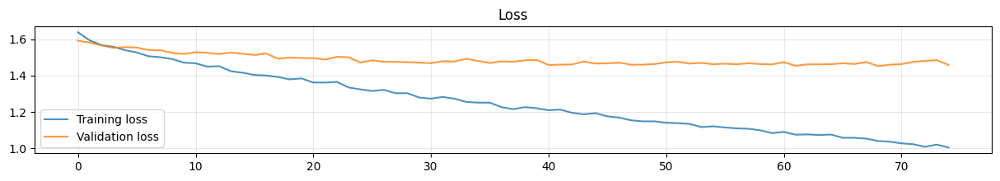

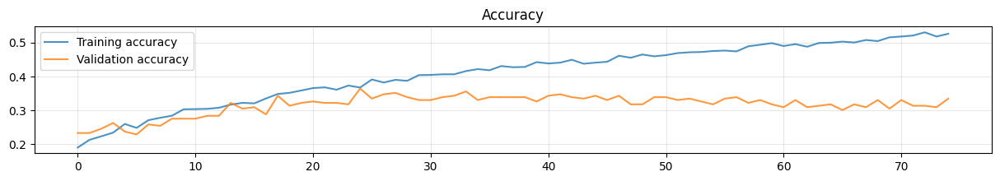

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Fine tuning:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

%cd /content/drive/MyDrive/AI_project

model = load_model('multitumor_classes_fullslice_efficientnet_dataaug.keras')

#Display summary
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

/content/drive/.shortcut-targets-by-id/1cZgPrYMBMZd9pUEvo9b_6Vm5-ifLGXPh/AI_project


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 8,040,074 (30.67 MB)

 Trainable params: 90,501 (353.52 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

 Optimizer params: 181,004 (707.05 KB)

In [ ]:
# Set all layers in efficientnetb0 as trainable
model.trainable = True

# Set all layers as non-trainable
for layer in model.layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
       # print(i, layer.name, type(layer).__name__, layer.trainable)

# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(model.layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)


model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

0 input_layer False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block1b_dwconv False
19 block1b_bn False
20 block1b_activation False
21 block1b_se_squeeze False
22 block1b_se_reshape False
23 block1b_se_reduce False
24 block1b_se_expand False
25 block1b_se_excite False
26 block1b_project_conv False
27 block1b_project_bn False
28 block1b_drop False
29 block1b_add False
30 block2a_expand_conv False
31 block2a_expand_bn False
32 block2a_expand_activation False
33 block2a_dwconv_pad False
34 block2a_dwconv False
35 block2a_bn False
36 block2a_activation False
37 block2a_se_squeeze False
38 block2a_se_reshape False
39 block2a_se_redu

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 8,040,074 (30.67 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

 Optimizer params: 181,004 (707.05 KB)

In [ ]:
# Define the patience value for early stopping
patience = 40

# Create an EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True,
)

# Store the callback in a list
callbacks = [early_stopping]

In [ ]:
# Compile the model
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 7,859,070 (29.98 MB)

 Trainable params: 7,488,536 (28.57 MB)

 Non-trainable params: 370,534 (1.41 MB)

In [ ]:
# Train the model
history = model.fit(
    X_train_combined, y_train_combined,
    epochs=1000,
    class_weight=class_weight_dict,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history


# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')



Epoch 1/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 139s 454ms/step - accuracy: 0.4010 - loss: 1.3055 - val_accuracy: 0.3178 - val_loss: 1.5012
Epoch 2/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 67s 100ms/step - accuracy: 0.4093 - loss: 1.2596 - val_accuracy: 0.3263 - val_loss: 1.4963
Epoch 3/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - accuracy: 0.4222 - loss: 1.2346 - val_accuracy: 0.3178 - val_loss: 1.4911
Epoch 4/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - accuracy: 0.4220 - loss: 1.2174 - val_accuracy: 0.3432 - val_loss: 1.4730
Epoch 5/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - accuracy: 0.4645 - loss: 1.1624 - val_accuracy: 0.3517 - val_loss: 1.4731
Epoch 6/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - accuracy: 0.4640 - loss: 1.1368 - val_accuracy: 0.3347 - val_loss: 1.4743
Epoch 7/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - accuracy: 0.4599 - loss: 1.1227 - val_accuracy: 0.3263 - val_loss: 1.4818
Epoch 8/1000
119/119 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - accuracy: 

In [ ]:
# Format the filename to avoid special character issues
# Replace decimal point in accuracy with underscore, or convert to an integer
formatted_accuracy = str(final_val_accuracy).replace('.', '_')
model_filename = 'multitumor_classes_fullslice_efficientnet_dataaug_ft.keras'

# Save model to the Homework directory
model.save(model_filename)
print(f"Model saved as {model_filename}")

Model saved as multitumor_classes_fullslice_efficientnet_dataaug_ft.keras


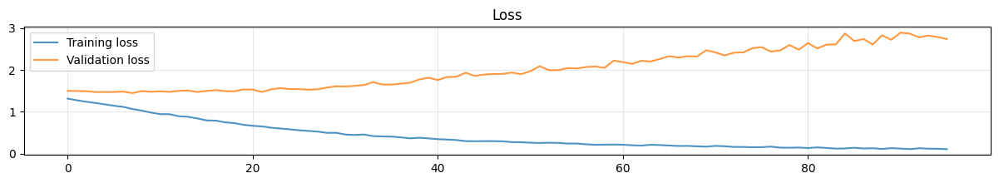

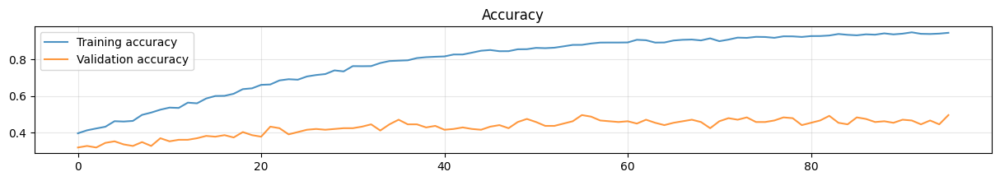

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Make inference:

In [ ]:
# ipython-input-193-ec9259d9cb7b
# Predict labels for the entire test set
predictions = model.predict(X_test*255, verbose=0)
#predictions=(model.predict(X_test*255) > 0.5).astype("int32") # This line was causing the error
pred_classes = np.argmax(predictions, axis=1)  # Get predicted class labels
# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (237, 5)


Accuracy score over the test set: 0.3544
Precision score over the test set: 0.3412
Recall score over the test set: 0.3544
F1 score over the test set: 0.3435


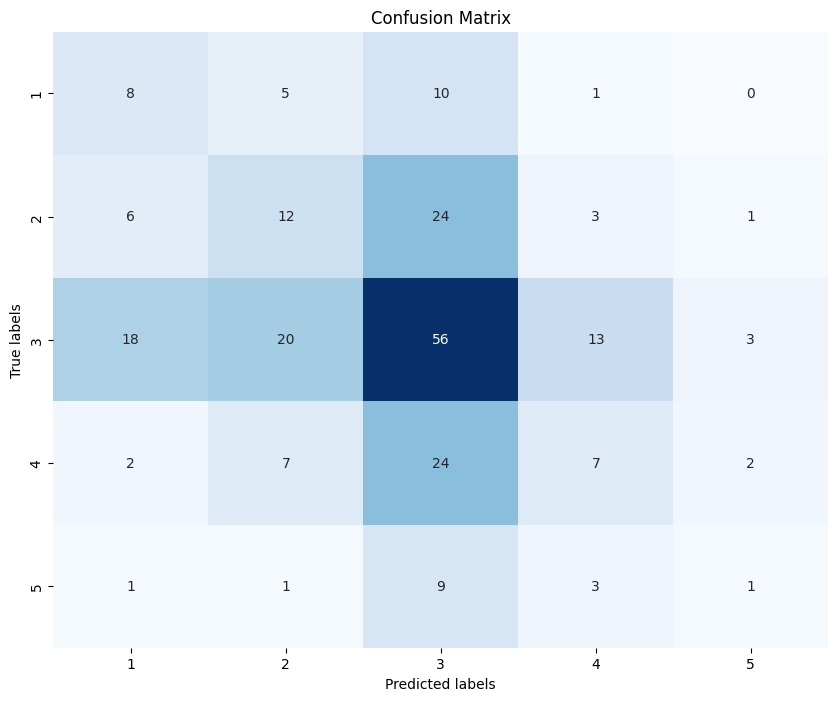

In [ ]:
# ipython-input-195-ec9259d9cb7b
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
labels = [1, 2, 3, 4 ,5]
# Convert predictions and ground truth to class labels
#pred_classes = predictions  # This line was causing the error
#true_classes = y_test      # This line was causing the error
true_classes = np.argmax(y_test, axis=1)  # Get true class labels

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.ylabel('True labels')
plt.xlabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()